# Imports

In [83]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import holidays
import pickle
import warnings
from datetime import timedelta,datetime
from sklearn.linear_model import Ridge
from currency_converter import CurrencyConverter
from sklearn.preprocessing import StandardScaler
from pyod.models.lof import LOF
from pyod.models.pca import PCA
from sklearn.ensemble import IsolationForest
from faker import Faker
warnings.filterwarnings("ignore")

# Load the datasets

In [84]:
Abandoned_orders_data=pd.read_csv('Abandoned_checkout_28_6.csv')
AOV_orders_data=pd.read_csv('AOV_orders_28_06.csv')
Conversion_Rate_orders_data=pd.read_csv('Conversion_Rate_orders_28_06.csv')
Sessions_data=pd.read_csv('Sessions_28_06.csv')

In [85]:
#For each country has a code for identify in holidays library
dict_code_country={'Italy':'IT','United States':'US','United Kingdom':'GB','Israel':'IL','Netherlands':'NL','Canada':'CA','Norway':'NO','Portugal':'PT','Brazil':'BR','Saudi Arabia':'SA','Australia':'AU','Switzerland':'CH','Germany':'DE','Chile':'CL','South Africa':'ZA','Philippines':'PH','Finland':'FI','New Zealand':'NZ','Peru':'PE','Egypt':'EG','Bulgaria':'BG','India':'IN','Japan':'JP','Belgium':'BE','Colombia':'CO','Poland':'PL'}

In [86]:
# Create a dictionary of countries and their weekend days
dict_countries_weekend = {
    'Italy': [5, 6],
    'United States': [5, 6],
    'United Kingdom': [5, 6],
    'Canada': [5, 6],
    'Israel': [4, 5],
    'Netherlands': [5, 6],
    'Norway': [5, 6],
    'Portugal': [5, 6],
    'Brazil': [5, 6],
    'Saudi Arabia': [4, 5],
    'Australia': [5, 6],
    'Switzerland': [5, 6],
    'Germany': [5, 6],
    'Chile': [5, 6],
    'South Africa': [5, 6],
    'Philippines': [5, 6],
    'Finland': [5, 6],
    'New Zealand': [5, 6],
    'Peru': [5, 6],
    'Egypt': [4, 5],
    'Bulgaria': [5, 6],
    'India': [6],
    'Japan': [5, 6],
    'Belgium': [5, 6],
    'Colombia': [5, 6],
    'Poland': [5,6],
}

# Useful functions for all datasets

In [87]:
def create_store_name():
    fake = Faker()

    # Create a dictionary to store names
    store_name_dict = {}

    # Get unique store IDs
    unique_store_ids = Abandoned_orders_data['store_id'].unique()
    unique_store_ids = np.concatenate((unique_store_ids, Sessions_data['store_id'].unique()))
    unique_store_ids = np.concatenate((unique_store_ids, AOV_orders_data['store_id'].unique()))
    unique_store_ids = np.concatenate((unique_store_ids, Conversion_Rate_orders_data['store_id'].unique()))

    for store_id in unique_store_ids:
        store_name = fake.company()
        while store_name in store_name_dict.values():
            store_name = fake.company()  # Generate a new name if it's a duplicate

        store_name_dict[store_id] = store_name
    return store_name_dict

In [88]:
# We have the database until 01.07.2023 so we take the last month as the test set for the reports. since we want to calculate for test set the mean of the last 7 days, the first 6 days in test are same like the 6 last days in train.
def train_test_split(df):
    df['date'] = pd.to_datetime(df['date'])
    start_date_test = pd.to_datetime('2023-05-26')
    end_date_train = pd.to_datetime('2023-05-31')

    train_df = df[(df['date'] <= end_date_train)]
    test_df = df[(df['date'] >= start_date_test)]

    return train_df,test_df

In [89]:
# Since each store has a revenue in diffrent currency, we want to know the revenue in usd currency.
def handle_currency(df,target_column):
    # create currency converter object
    c = CurrencyConverter()

    # define USD as the target currency
    target_currency = 'USD'

    currency_dict = {
        'PEN': 0.27,
        'CLP': 0.0012,
        'EGP': 0.032,
        'SAR': 0.27,
        'COP': 0.00021,
    }
    # loop through each row and convert revenue to USD
    for i, row in df.iterrows():
        currency = row['currency']
        if currency in currency_dict:
            revenue_usd = row[target_column] * currency_dict[currency]
        else:
            revenue_usd = c.convert(row[target_column], currency, target_currency)
        if target_column == 'orders_revenue':
            df.at[i, 'orders_revenue_usd'] = revenue_usd
        else:
            df.at[i, 'AOV_usd'] = revenue_usd
    df = df.drop([target_column], axis=1)
    return df

In [90]:
def filter_df(df,stores):
    df['date'] = pd.to_datetime(df['date'])
    # filter out orders older than 3 years
    today = datetime.now()
    df = df[df['date'] > today.replace(year=today.year-3)]

    df = df[df['store_name'].isin(stores)]
    return df

In [91]:
# We choose to take the 50 largest stores because we want to take a stores with enough amount of data. 
def select_stores(df):
    # Filter the original dataframe based on the count of each store_id
    store_counts = df['store_name'].value_counts()
    return store_counts.nlargest(50).index

In [154]:
# We want to check how the kpi divides in each industry.
def hist_industries(df,kpi):
    # Get the unique industries
    industries = df['industry'].unique()

    if kpi == 'AOV_usd':
        fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(30,30))
    else:
        fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,30))

    # Iterate through each industry and plot its histogram
    for idx, industry in enumerate(industries):
        row = idx // 4
        col = idx % 4
        hist, bin_edges = np.histogram(df[df['industry'] == industry][kpi])
        if kpi == 'Abandoned_orders' or kpi ==  'Conversion_Rate_orders' :
            axs[row, col].bar(bin_edges[:-1], hist, alpha=0.5, width=0.1)
        else :
            axs[row, col].hist(bin_edges[:-1], bins=bin_edges, weights=hist)
        axs[row, col].set_title('Histogram of {} for {} Industry'.format(kpi,industry))
        axs[row, col].set_xlabel(kpi)
        axs[row, col].set_ylabel('Number of Observations')

    # Adjust the spacing between subplots
    plt.tight_layout()

    # Display the subplots
    plt.show()

In [158]:
# we want to check how many stores there are in each industry and how the kpi divides.
def hist_stores(df,kpi):
    # Get the unique industries
    industries = df['industry'].unique()

    if kpi == 'AOV_usd':
        fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(30,30))
    else:
        fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,30))

    # Iterate through each industry and plot its histogram
    for idx, industry in enumerate(industries):
        row = idx // 4
        col = idx % 4

        # Filter data for the current industry
        industry_data = df[df['industry'] == industry]

        # Calculate the average abandoned orders per store
        avg_kpi_per_store = industry_data.groupby('store_id')[kpi].mean()
        # Calculate the histogram of changes in average abandoned orders per store
        if kpi == 'Abandoned_orders' or kpi ==  'Conversion_Rate_orders' :
            hist, bin_edges = np.histogram(avg_kpi_per_store, bins=np.arange(0, 1.1, 0.2))
            axs[row, col].bar(bin_edges[:-1], hist, alpha=0.5, width=0.1)
        else :
            hist, bin_edges = np.histogram(avg_kpi_per_store)
            axs[row, col].hist(bin_edges[:-1], bins=bin_edges, weights=hist)

        # Plot the bar chart
        axs[row, col].set_title('Number of Stores with average {} for {} Industry'.format(kpi,industry))
        axs[row, col].set_xlabel('Average {} per Store'.format(kpi))
        axs[row, col].set_ylabel('Number of Stores')

    # Adjust the spacing between subplots
    plt.tight_layout()

    # Display the subplots
    plt.show()

In [94]:
def boxplot(df,kpi):
    # Get the unique industries
    industries = df['industry'].unique()
    # Create subplots for each industry
    if kpi == 'AOV_usd':
        fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(25,20))
    else:
        fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(25,20))
    # Iterate through each industry and plot its boxplot
    for idx, industry in enumerate(industries):
        row = idx // 4
        col = idx % 4
        axs[row, col].boxplot(df[df['industry'] == industry][kpi])
        axs[row, col].set_title('Boxplot of {} for {} Industry'.format(kpi,industry))
        axs[row, col].set_ylabel(kpi)

    # Adjust the spacing between subplots
    plt.tight_layout()

    # Display the subplots
    plt.show()

In [95]:
def plot_kpi(df,kpi,stores):
    # Filter the data to include only the dates between 31.05.2022 and 31.05.2023
    start_date = pd.to_datetime('31.05.2022')
    end_date = pd.to_datetime('31.05.2023')
    filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

    # Group the filtered data by store_id and date and compute the mean of Abandoned_orders
    grouped_last_year = filtered_df.groupby(['store_id', 'date']).mean()[kpi]

    # Create a figure with 5 rows and 5 columns of subplots
    fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,20))

    # Iterate over the stores and plot the mean abandoned orders for each company in a subplot
    for i, store_id in enumerate(stores):
        data = grouped_last_year[store_id]
        row = i // 5  # Calculate the row index of the subplot
        col = i % 5   # Calculate the column index of the subplot
        axs[row, col].scatter(data.index,data.values)
        axs[row, col].set_title('{} for Store {}'.format(kpi,store_name_dict[store_id]))
        axs[row, col].set_xlabel('Date')
        axs[row, col].xaxis.set_major_locator(mdates.MonthLocator(interval=2))
        axs[row, col].set_ylabel(kpi)
    plt.tight_layout()
    plt.show()

In [96]:
# We want to see the mean change of the KPI with the day before for each date and industry
def mean_kpi_change(df,kpi):
    # Get the unique industries
    industries = df['industry'].unique()

    # Filter the data to include only the dates between 31.05.2022 and 31.05.2023
    start_date = pd.to_datetime('31.05.2022')
    end_date = pd.to_datetime('31.05.2023')
    filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

    # Create a figure with 4 rows and 3 columns of subplots
    if kpi == 'AOV_usd':
        fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(25,20))
    else:
        fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(25,20))
    # Group the filtered data by store_id and date and compute the mean of Abandoned_orders
    grouped_last_year_industry = filtered_df.groupby(['industry', 'date']).mean()[kpi]
    # Iterate over the industries and plot the mean abandoned orders for each industry in a subplot
    for i, industry in enumerate(industries):
        data = grouped_last_year_industry[industry]
        for j in range(len(data)-1):
            new_avg = (data[::-1][j] / data[::-1][j+1])
            data[::-1][j] = new_avg
        data[0] = data.mean()
        row = i // 4  # Calculate the row index of the subplot
        col = i % 4   # Calculate the column index of the subplot
        axs[row, col].plot(data.index, data.values)
        axs[row, col].set_title('Mean {} for {} Industry'.format(kpi,industry))
        axs[row, col].set_xlabel('Date')
        axs[row, col].set_ylabel('{} Percentage Change'.format(kpi))

    plt.tight_layout()
    plt.show()

In [97]:
# We estimate that there are a changes in the kpis on this period because people change their consumption behavior so we want to identify these days.
def is_within_two_weeks_of_holiday(date, country):
    # Get the holiday calendar for the given country
    Country = dict_code_country.get(country, '')
    holiday_calendar = holidays.CountryHoliday(Country, years=date.year)

    # check if the given date is a holiday
    if date in holiday_calendar:
        return holiday_calendar.get(date)

    # Check if the date is within two weeks of a holiday
    for i in range(1, 15):
        check_date = date + timedelta(days=i)
        if check_date in holiday_calendar:
            return holiday_calendar.get(check_date)

    # If we haven't returned yet, then there is no holiday within two weeks
    return "Regular Day"

In [98]:
def holiday_effect(df,kpi):
    one_hot_encoded = pd.get_dummies(df['less_than_2_weeks_before_holiday'])
    df_for_regression = pd.concat([df[kpi], one_hot_encoded], axis=1)
    # fit ridge regression model
    X = df_for_regression.drop(kpi, axis=1)
    y = df_for_regression[kpi]
    reg = Ridge(alpha=1.0).fit(X, y)

    # calculate proportional significance
    proportional_significance = reg.coef_ / y.mean()

    dict_regression_values = {}

    holidays = list(df_for_regression.drop(kpi, axis=1).columns)
    i = 0
    for holiday in holidays:
        dict_regression_values[holiday] = proportional_significance[i]
        i+=1
    return df['less_than_2_weeks_before_holiday'].replace(dict_regression_values),dict_regression_values

In [99]:
# Define a function to split the date column to year,quarter,month,day at the week.
def time_process(df):
    df['datetime_year'] = df['date'].dt.year
    df['datetime_month'] = df['date'].dt.month
    df['datetime_dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    return df

In [100]:
# Define a function to check if a date is a weekend day in a given country
def is_weekend(day, country):
    # Get the weekend days for the given country
    weekend_days = dict_countries_weekend.get(country, [])

    # Check if the date is a weekend day
    if day in weekend_days:
        return 1
    else:
        return 0

In [101]:
# We want to check the diffrences in the kpis between days that in weekend and days aren't.
def kpi_weekend_vs_not(df,kpi):
    # Get the unique industries
    industries = df['industry'].unique()
    # create subplots
    if kpi == 'AOV_usd':
        fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(25,20))
    else:
        fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(25,20))

    # iterate over industries and plot graph in each subplot
    for i, industry in enumerate(industries):
        # filter data for the current industry
        industry_data = df[df['industry'] == industry]

        # compute mean of Abandoned_orders for holidays=0 and holidays=1
        means = industry_data.groupby('weekend')[kpi].mean()

        # plot graph in the current subplot
        ax = axs[i//4, i%4]
        ax.bar(['Not a weekend', 'weekend'], means)
        ax.set_title(industry)
        ax.set_xlabel('weekend')
        ax.set_ylabel('Average {}'.format(kpi))

    # add overall title and adjust layout
    fig.suptitle('Average {} for weekend and Non-weekend by Industry'.format(kpi), fontsize=16)
    fig.tight_layout()
    plt.show()

In [102]:
def create_new_features(df,kpi):
    # Group the data by industry and date and compute the mean of KPI
    Total_grouped_industry = df.groupby(['industry', 'date']).mean()[kpi]
    # Reset the index of the grouped data to create a new dataframe with industry, date, and mean KPI columns
    Total_grouped_industry = Total_grouped_industry.reset_index()
    Total_grouped_industry.columns = ['industry', 'date', 'mean_{}_by_industry'.format(kpi)]

    # Merge the mean KPI back into the original dataframe based on the industry and date columns
    df = df.merge(Total_grouped_industry, on=['industry', 'date'], how='left')
    return df

In [103]:
def create_rolling_avg_columns(df,kpi):

    # Group the data by store_id and date and compute the sum of KPI
    grouped_store = df.groupby(['store_id', 'date']).sum()[kpi]
    grouped_store = grouped_store.reset_index()


    # Compute the rolling average of KPI for each store over the preceding 3 days
    rolling_avg_3 = grouped_store.groupby('store_id',).rolling(window=3).mean().reset_index()
    rolling_avg_3['date']=grouped_store['date']
    rolling_avg_3.drop(columns = 'level_1',inplace=True)
    rolling_avg_3= rolling_avg_3.rename(columns={kpi: 'mean_last_3_sample'})

    # Merge the original dataframe with the rolling averages dataframe
    df = pd.merge(df, rolling_avg_3, on=['store_id', 'date'], how='left')

    # Compute the rolling average of KPI for each store over the preceding 7 days
    rolling_avg_7 = grouped_store.groupby('store_id',).rolling(window=7).mean().reset_index()
    rolling_avg_7['date']=grouped_store['date']
    rolling_avg_7.drop(columns = 'level_1',inplace=True)
    rolling_avg_7= rolling_avg_7.rename(columns={kpi: 'mean_last_7_sample'})

    # Merge the original dataframe with the rolling averages dataframe
    df = pd.merge(df, rolling_avg_7, on=['store_id', 'date'], how='left')

    df = df.sort_values(['store_id', 'date'])
    df.drop(columns = 'Unnamed: 0',inplace=True)
    return df

In [104]:
def pearson_corr_heatmap(df):
    corr_df = df.corr()
    mask = np.zeros_like(corr_df, dtype=bool)
    mask[np.triu_indices_from(mask, k=1)] = True

    fig, ax = plt.subplots(figsize=(20, 20))
    plt.title('Pearson Correlation Heatmap', fontsize=23)

    sns.heatmap(corr_df, linewidths=0.25, vmax=1.0, square=True ,
                linecolor='w', annot=True, mask=mask)

In [105]:
def model_anomaly_detection(model,df_train, df_test,kpi,contamination,n_neighbors):
    df_train_return = df_train.copy()
    df_test_return = df_test.copy()

    df_train_processed = df_train.copy()
    df_test_processed = df_test.copy()

    df_train_processed, df_test_processed = df_train_processed.align(df_test_processed, axis=1, fill_value=0)

    df_train_processed.drop(columns = 'date',inplace=True)
    df_train_processed.drop(columns = 'orders_revenue_usd',inplace=True)
    df_train_processed.drop(columns = 'store_id',inplace=True)
    df_train_processed.drop(columns = 'industry',inplace=True)
    df_train_processed.drop(columns = f'mean_{kpi}_by_industry',inplace=True)
    df_train_processed.drop(columns = 'store_name',inplace=True)
    df_train_processed.drop(columns = 'less_than_2_weeks_before_holiday',inplace=True)

    df_test_processed.drop(columns = 'less_than_2_weeks_before_holiday',inplace=True)
    df_test_processed.drop(columns = 'date',inplace=True)
    df_test_processed.drop(columns = 'store_id',inplace=True)
    df_test_processed.drop(columns = 'orders_revenue_usd',inplace=True)
    df_test_processed.drop(columns = 'industry',inplace=True)
    df_test_processed.drop(columns = f'mean_{kpi}_by_industry',inplace=True)
    df_test_processed.drop(columns = 'store_name',inplace=True)

    if model == 'pca':
        # Standardize the data
        scaler = StandardScaler()
        df_train_scaled = scaler.fit_transform(df_train_processed)
        df_test_scaled = scaler.transform(df_test_processed)
        # Perform PCA
        clf = PCA(contamination=contamination,n_components=n_neighbors)
        clf.fit(df_train_scaled)
        test_anomalies = clf.predict(df_test_scaled)  # outlier labels (0 or 1)
    elif model == 'isolation_forest':
        clf = IsolationForest(n_estimators=n_neighbors,contamination=contamination)
        clf.fit(df_train_processed)
        test_anomalies = clf.predict(df_test_processed)
    else:
        clf = LOF(contamination=contamination, n_neighbors=n_neighbors)
        clf.fit(df_train_processed)
        test_anomalies = clf.predict(df_test_processed)

        # get the prediction labels and outlier scores of the training data
    train_anomalies = clf.predict(df_train_processed)  # binary labels (0: inliers, 1: outliers)
    if model == 'isolation_forest':
        train_anomalies = np.where(train_anomalies == -1, 1, 0)
        test_anomalies = np.where(test_anomalies == -1, 1, 0)

    # Add the anomaly column to the train
    df_train_return['anomalies'] = train_anomalies

    # Add the anomaly column to the test
    df_test_return['anomalies'] = test_anomalies

    return df_train_return,df_test_return

In [106]:
def model_anomaly_detection_for_train_and_validation(model, df_train,kpi,contamination,n_neighbors):
    df_train_return = df_train.copy()
    df_train_processed = df_train.copy()

    df_train_processed.drop(columns = 'date',inplace=True)
    df_train_processed.drop(columns = 'orders_revenue_usd',inplace=True)
    df_train_processed.drop(columns = 'store_id',inplace=True)
    df_train_processed.drop(columns = 'industry',inplace=True)
    df_train_processed.drop(columns = f'mean_{kpi}_by_industry',inplace=True)
    df_train_processed.drop(columns = 'store_name',inplace=True)
    df_train_processed.drop(columns = 'less_than_2_weeks_before_holiday',inplace=True)

    if model == 'pca':
        # Standardize the data
        scaler = StandardScaler()
        df_train_scaled = scaler.fit_transform(df_train_processed)
        # Perform PCA
        clf = PCA(contamination=contamination,n_components=n_neighbors)
        clf.fit(df_train_scaled)
    elif model == 'lof':
        clf = LOF(contamination=contamination, n_neighbors=n_neighbors)
        clf.fit(df_train_processed)
    else:
        clf = IsolationForest(n_estimators=n_neighbors,contamination=contamination)
        clf.fit(df_train_processed)

    anomalies = clf.predict(df_train_processed)
    if model == 'isolation_forest':
        anomalies = np.where(anomalies == -1, 1, 0)
    df_train_return['anomalies'] = anomalies
    return clf,df_train_processed.shape[1],df_train_return

In [107]:
def plot_anomalies(df,kpi,stores):
    start_date = '2022-05-31'
    end_date = '2023-05-31'
    # Group the filtered data by industry, date and anomalous column and compute the mean of KPI
    filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]
    filtered_df['holiday'] = filtered_df['less_than_2_weeks_before_holiday'].apply(lambda x: 'regular_day' if x == 'Regular Day' else 'not_regular_day')
    grouped_last_year = filtered_df.groupby(['store_id', 'date','holiday', 'anomalies']).mean()[kpi].reset_index()


    # Create a figure with 4 rows and 3 columns of subplots
    fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(25,25))


    # Iterate over the industries and plot the mean KPI for each industry in a subplot
    for i, store in enumerate(stores):
        # Filter the data for the current industry
        data = grouped_last_year[grouped_last_year['store_id'] == store]
        row = i // 5  # Calculate the row index of the subplot
        col = i % 5  # Calculate the column index of the subplot

        sns.scatterplot(data=data,style='holiday', markers=['o', '^'], x='date', y=kpi, hue='anomalies', ax=axs[row, col],palette=['g','r'])
        axs[row, col].set_title('{} for {} store'.format(kpi,store_name_dict[store]))
        axs[row, col].set_xlabel('Date')
        axs[row, col].set_ylabel(kpi)
        axs[row, col].legend()
        axs[row, col].xaxis.set_major_locator(mdates.MonthLocator(interval=1))

    plt.tight_layout()
    plt.show()

In [108]:
#let's rank these columns by numbers the importance of year and the level of shopify_plan
def handling_shopify_plan_and_year(df):
    df = df.drop(df[(df['shopify_plan_display_name'] == 'Pause and Build') | (df['shopify_plan_display_name'] == 'frozen')].index)
    shopify_plan_mapping = {
        "Shopify": 2,
        "Shopify Plus": 4,
        "Basic Shopify": 1,
        "Advanced Shopify": 3
    }
    year_mapping = {
        2020: 1,
        2021: 2,
        2022: 3,
        2023: 4
    }
    #replace
    df['shopify_plan_display_name'] = df['shopify_plan_display_name'].replace(shopify_plan_mapping)
    df['datetime_year'] = df['datetime_year'].replace(year_mapping)
    return df

In [109]:
# Split the train set to train and validation sets each store.
def split_data_by_store(df, test_ratio=0.08):
    df.sort_values('date', inplace=True)

    train_data = pd.DataFrame()
    test_data = pd.DataFrame()

    for store_id, store_df in df.groupby("store_id"):
        train, test = train_test_split(store_df, test_size=test_ratio, random_state=42, shuffle=False)
        train_data = pd.concat([train_data, train])
        test_data = pd.concat([test_data, test])

    return train_data, test_data

In [110]:
# The following function creates a dummy column for each option of the dates categorical variables
def process_dummies_features(df):
    dummy_quarter=pd.get_dummies(df["quarter"],prefix="quarter",drop_first=True)
    dummy_datetime_dayofweek=pd.get_dummies(df["datetime_dayofweek"],prefix="datetime_dayofweek",drop_first=True)
    dummy_datetime_year=pd.get_dummies(df["datetime_year"],prefix="datetime_year",drop_first=True)
    dummy_holiday_bins=pd.get_dummies(df['holiday_bins'],prefix="holiday_bins",drop_first=True)
    # Now, we have a (dummy) column for each option for each categorical variable
    # The function removes the original columns of the categorical variables
    df = df.drop(["quarter","datetime_dayofweek","datetime_year",'holiday_bins'],axis=1)
    return pd.concat([df,dummy_quarter,dummy_datetime_dayofweek,dummy_datetime_year,dummy_holiday_bins],axis=1)

In [111]:
# We do the same pre processing that we did in train set for the test set.
def pre_processing_test(df_train,df_test, stores, columns, dict_holiday_effect,kpi):
    df_test['date'] = pd.to_datetime(df_test['date'])
    df_test = df_test[df_test['country'] != 'Tanzania, United Republic Of']
    df_test = filter_df(df_test,stores)

    if kpi == 'Abandoned_orders':
        df_test = handle_currency(df_test,'orders_revenue')
        df_test['Abandoned_orders'] = df_test['abandeoned_checkout']/df_test['all_checkouts']
        df_test = create_new_features(df_test, 'Abandoned_orders')
        df_test = create_rolling_avg_columns(df_test, 'Abandoned_orders')
    if kpi == 'Conversion_Rate_orders':
        df_test = handle_currency(df_test,'orders_revenue')
        df_test['Conversion_Rate_orders'] = df_test['sum_transaction']/df_test['sum_all_visits']
        df_test = create_new_features(df_test, 'Conversion_Rate_orders')
        df_test = create_rolling_avg_columns(df_test, 'Conversion_Rate_orders')
    if kpi == 'Sessions':
        df_test = handle_currency(df_test,'orders_revenue')
        df_test= df_test.rename(columns={'sum_all_visits': 'Sessions'})
        df_test = create_new_features(df_test, 'Sessions')
        df_test = create_rolling_avg_columns(df_test, 'Sessions')
    if kpi == 'AOV_usd':
        df_test= df_test.rename(columns={'aov': 'AOV'})
        df_test['orders_revenue'] = df_test['AOV'] * df_test['order_count']
        df_test = handle_currency(df_test,'AOV')
        df_test = handle_currency(df_test,'orders_revenue')
        df_test = create_new_features(df_test, 'AOV_usd')
        df_test = create_rolling_avg_columns(df_test, 'AOV_usd')


    df_test = time_process(df_test)
    df_test = handling_shopify_plan_and_year(df_test)

    df_test['less_than_2_weeks_before_holiday'] = df_test[['date', 'country']].apply(lambda row: is_within_two_weeks_of_holiday(row['date'], row['country']), axis=1)
    df_test['holiday_effect'] = df_test['less_than_2_weeks_before_holiday'].replace(dict_holiday_effect)
    if kpi == "Sessions":
        bins = [-2, -0.7,0, 1, 20]
    elif kpi == "AOV_usd":
        bins = [-1, -0.22,0, 0.2, 1]
    elif kpi == "Conversion_Rate_orders":
        bins = [-1, -0.15, 0, 0.11, 2]
    else:
        bins = [-1, -0.05, 0, 0.3, 2]

    labels = [-2,-1,1,2]

    # Use pd.cut to bin the 'holiday_effect' column and replace the values with the corresponding labels
    df_test['holiday_bins'] = pd.cut(df_test['holiday_effect'], bins=bins, labels=labels)
    # Perform one-hot encoding for the 'holiday_bins' column
    df_test = pd.get_dummies(df_test, columns=['holiday_bins'],prefix="holiday_bins",drop_first=True)

    df_test['weekend'] = df_test[['datetime_dayofweek', 'country']].apply(lambda row: is_weekend(row['datetime_dayofweek'], row['country']), axis=1)

    df_test = df_test.dropna()
    df_test = process_dummies_features(df_test)

    df_train, df_test = df_train.align(df_test, axis=1, fill_value=0)

    
    df_test = df_test[columns]
    return df_test

## Add store name to each store id

In [112]:
store_name_dict = create_store_name()
Abandoned_orders_data['store_name'] = Abandoned_orders_data['store_id'].map(store_name_dict)
Conversion_Rate_orders_data['store_name'] = Conversion_Rate_orders_data['store_id'].map(store_name_dict)
Sessions_data['store_name'] = Sessions_data['store_id'].map(store_name_dict)
AOV_orders_data['store_name'] = AOV_orders_data['store_id'].map(store_name_dict)

# Train-test split

Train data is until 01-06-2023. Test data is since 01-06-2023. We will train the train data and then we will predict on the test data. Finally, we will create report to show the anomalies.

In [113]:
Abandoned_orders,Abandoned_orders_test = train_test_split(Abandoned_orders_data)
Conversion_Rate_orders,Conversion_Rate_orders_test = train_test_split(Conversion_Rate_orders_data)
Sessions,Sessions_test = train_test_split(Sessions_data)
AOV_orders,AOV_orders_test = train_test_split(AOV_orders_data)

# Abandoned orders

In [33]:
Abandoned_orders

,Unnamed: 0,date,orders,abandeoned_checkout,all_checkouts,orders_revenue,sum_total_discounts_in_abandeoned_checkout,currency,store_id,industry,country,shopify_plan_display_name,store_name
0,0,2023-02-21,2,17,19,154.79,8.4,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,Osborn-Bullock
1,1,2023-02-20,5,8,13,262.30,0.0,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,Osborn-Bullock
2,2,2023-02-19,5,1,6,176.73,0.0,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,Osborn-Bullock
3,3,2023-02-18,3,8,11,245.79,0.0,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,Osborn-Bullock
4,4,2023-02-17,6,3,9,214.39,0.0,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,Osborn-Bullock
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33789,152,2022-08-28,6,1,7,508.76,0.0,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,Hammond Group
33790,153,2022-08-24,3,4,7,311.91,0.0,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,Hammond Group
33791,154,2022-08-18,7,1,8,1389.00,0.0,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,Hammond Group
33792,155,2022-07-18,4,1,5,402.71,0.0,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,Hammond Group


In [34]:
# We drop the stores from Tanzania and drop the null values, and finaly we choose the 50 largest stores in Abandoned_orders dataset.
Abandoned_orders = Abandoned_orders[Abandoned_orders['country'] != 'Tanzania, United Republic Of']
Abandoned_orders = Abandoned_orders.dropna()
Abandoned_orders_stores = select_stores(Abandoned_orders)

In [35]:
# We choose only the samples that happend in the last 3 years.
Abandoned_orders = filter_df(Abandoned_orders,Abandoned_orders_stores)
Abandoned_orders

,Unnamed: 0,date,orders,abandeoned_checkout,all_checkouts,orders_revenue,sum_total_discounts_in_abandeoned_checkout,currency,store_id,industry,country,shopify_plan_display_name,store_name
390,0,2023-02-22,11,4,15,551.62,289.72,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver"
391,1,2023-02-21,54,39,93,3325.80,3676.91,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver"
392,2,2023-02-20,93,124,217,6220.35,14088.27,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver"
393,3,2023-02-19,72,152,224,5439.92,12854.52,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver"
394,4,2023-02-18,82,170,252,5830.02,16583.09,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33632,226,2022-06-03,48,2,50,6737.62,15.75,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC
33633,227,2022-05-31,44,2,46,5767.32,60.40,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC
33634,228,2022-05-30,62,4,66,8139.93,47.65,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC
33635,229,2022-05-29,71,1,72,9965.14,20.00,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC


In [36]:
Abandoned_orders.columns

Index(['Unnamed: 0', 'date', 'orders', 'abandeoned_checkout', 'all_checkouts',
       'orders_revenue', 'sum_total_discounts_in_abandeoned_checkout',
       'currency', 'store_id', 'industry', 'country',
       'shopify_plan_display_name', 'store_name'],
      dtype='object')

In [37]:
# We convert the revenue of all the stores to dollar currency.
Abandoned_orders = handle_currency(Abandoned_orders,'orders_revenue')

In [38]:
# Get the 25 highest profitable stores
top_stores_Abandoned_orders = Abandoned_orders.groupby('store_id')['orders_revenue_usd'].sum().nlargest(25).index
# Get the 25 lowest profitable stores
low_stores_Abandoned_orders = Abandoned_orders.groupby('store_id')['orders_revenue_usd'].sum().nsmallest(25).index

In [39]:
# Let's calculate the Abandoned_orders KPI
Abandoned_orders['Abandoned_orders'] = Abandoned_orders['abandeoned_checkout']/Abandoned_orders['all_checkouts']
Abandoned_orders

,Unnamed: 0,date,orders,abandeoned_checkout,all_checkouts,sum_total_discounts_in_abandeoned_checkout,currency,store_id,industry,country,shopify_plan_display_name,store_name,orders_revenue_usd,Abandoned_orders
390,0,2023-02-22,11,4,15,289.72,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver",551.620000,0.266667
391,1,2023-02-21,54,39,93,3676.91,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver",3325.800000,0.419355
392,2,2023-02-20,93,124,217,14088.27,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver",6220.350000,0.571429
393,3,2023-02-19,72,152,224,12854.52,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver",5439.920000,0.678571
394,4,2023-02-18,82,170,252,16583.09,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,"Harrison, Davidson and Weaver",5830.020000,0.674603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33632,226,2022-06-03,48,2,50,15.75,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC,5042.309359,0.040000
33633,227,2022-05-31,44,2,46,60.40,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC,4316.154905,0.043478
33634,228,2022-05-30,62,4,66,47.65,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC,6091.772053,0.060606
33635,229,2022-05-29,71,1,72,20.00,CAD,fd8ce804-305e-4c57-bfc5-04934952275d,APPAREL_AND_FASHION,Canada,Shopify Plus,Thompson LLC,7457.725233,0.013889


In [40]:
# Let's split the date column to year,quater,month and day of week.
Abandoned_orders = time_process(Abandoned_orders)

In [41]:
# Apply the handling_shopify_plan_and_year that rank these columns
Abandoned_orders = handling_shopify_plan_and_year(Abandoned_orders)

In [42]:
# For each date we determine if it is before holiday or not. 
Abandoned_orders['less_than_2_weeks_before_holiday'] = Abandoned_orders[['date', 'country']].apply(lambda row: is_within_two_weeks_of_holiday(row['date'], row['country']), axis=1)

In [43]:
# For each holiday we check the effect on the Abandoned_orders.
Abandoned_orders['holiday_effect'],dict_holiday_effect_Abandoned_orders = holiday_effect(Abandoned_orders,'Abandoned_orders')

In [44]:
# We want to group by the holidays's impact on the KPI, so we created bins with positive and negative effects with two levels each.

bins = [-1, -0.2, 0, 0.6, 2]
labels = [-2,-1,1,2]  # Assign labels -2,-1,1,2 to the respective bins

# Use pd.cut to bin the 'holiday_effect' column and replace the values with the corresponding labels
Abandoned_orders['holiday_bins'] = pd.cut(Abandoned_orders['holiday_effect'], bins=bins, labels=labels)
Abandoned_orders['holiday_bins'].value_counts()

-1    10680
-2     2369
1      1474
2       547
Name: holiday_bins, dtype: int64

In [45]:
# Apply the is_weekend function to the date and country columns
Abandoned_orders['weekend'] = Abandoned_orders[['datetime_dayofweek', 'country']].apply(lambda row: is_weekend(row['datetime_dayofweek'], row['country']), axis=1)

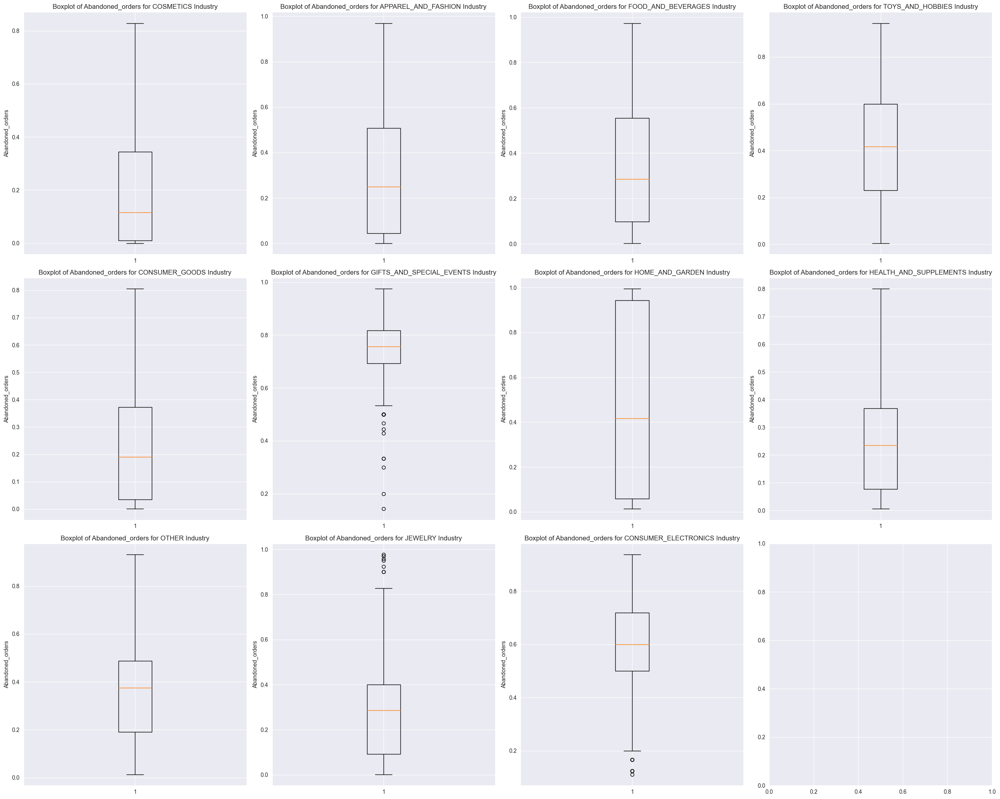

In [46]:
# Boxplot for Abandoned_orders for each industry.
boxplot(Abandoned_orders,'Abandoned_orders')

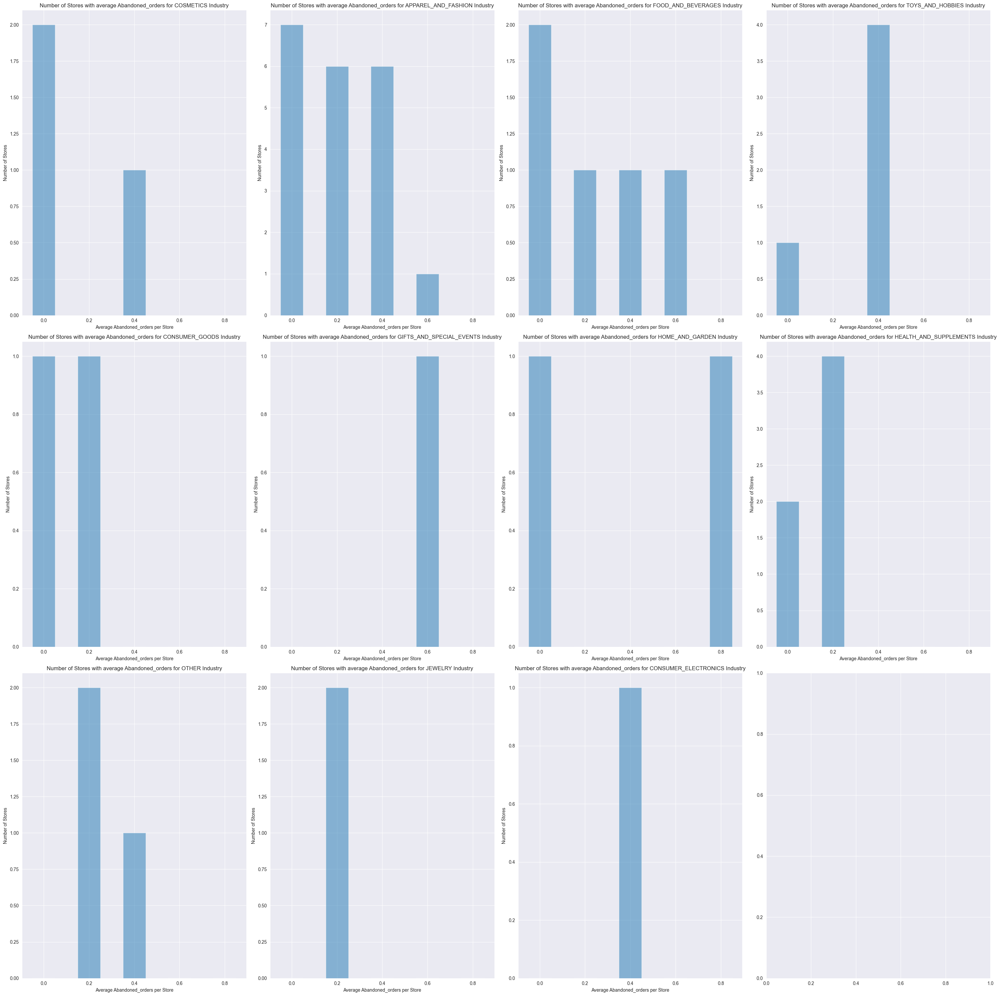

In [47]:
# We want to check how many stores there are in each industry and how the Abandoned_orders divides by ten bins.
hist_stores(Abandoned_orders,'Abandoned_orders')

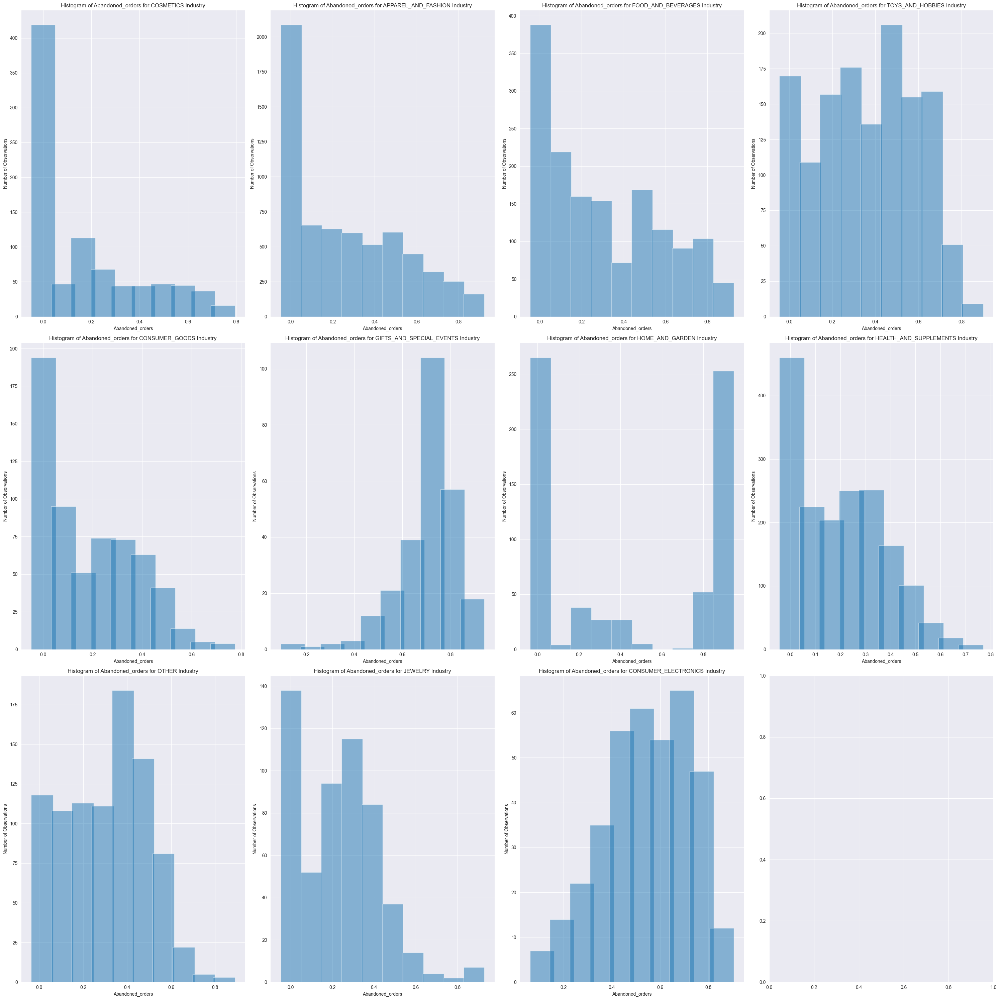

In [48]:
# We want to check how the Abandoned_orders divides for each industry.
hist_industries(Abandoned_orders,'Abandoned_orders')

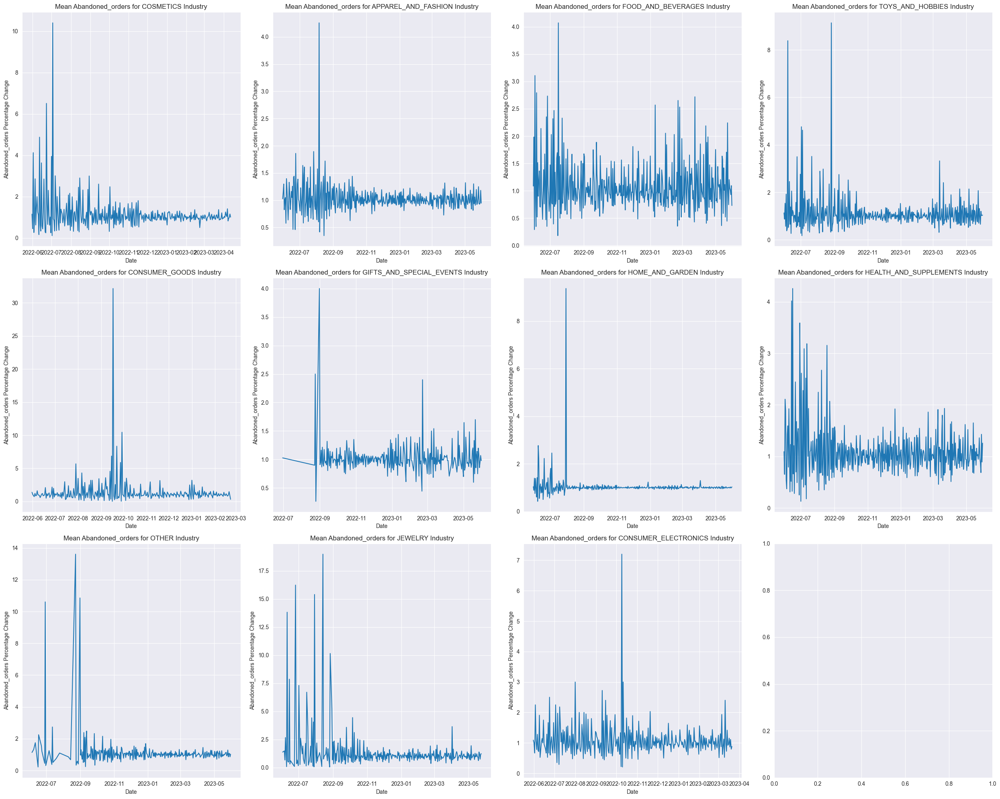

In [49]:
# We want to see the mean change of the Abandoned_orders with the day before for each date and industry
mean_kpi_change(Abandoned_orders,'Abandoned_orders')

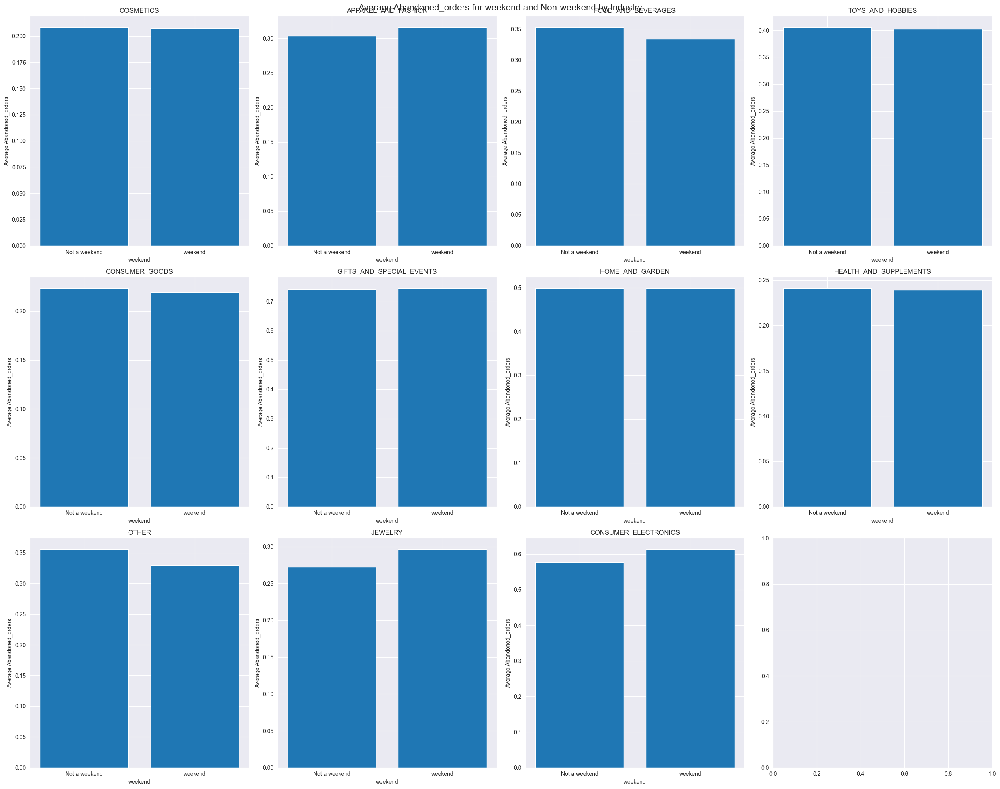

In [50]:
# We want to check the differences in the Abandoned_orders between days that in weekend and days aren't for each industry.
kpi_weekend_vs_not(Abandoned_orders,'Abandoned_orders')

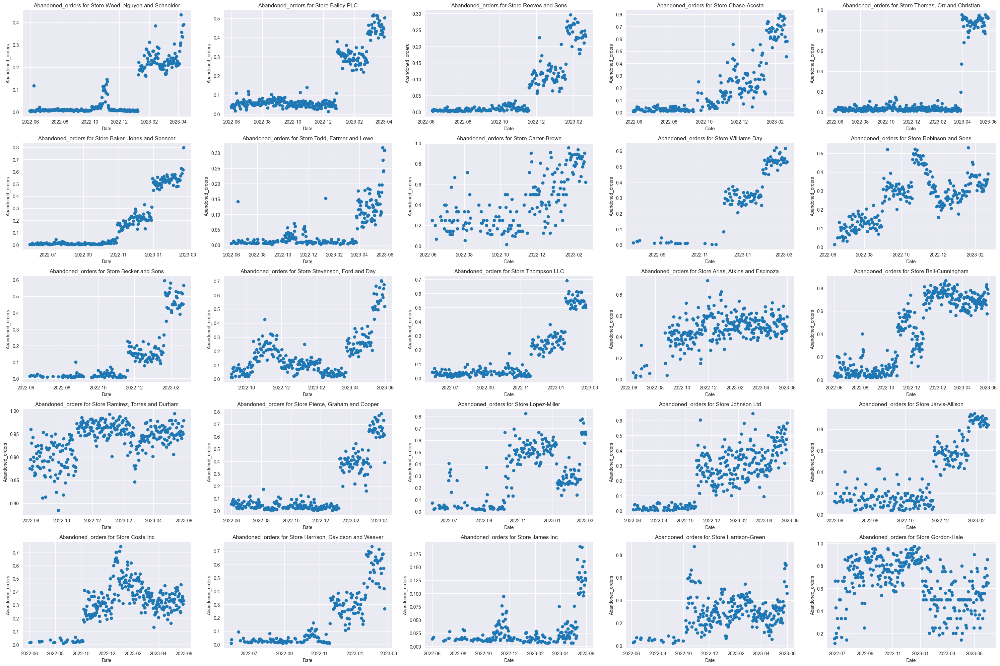

In [51]:
# We want to plot the Abandoned_orders for each top store in the last year since 31.05.2023
plot_kpi(Abandoned_orders,'Abandoned_orders',top_stores_Abandoned_orders)

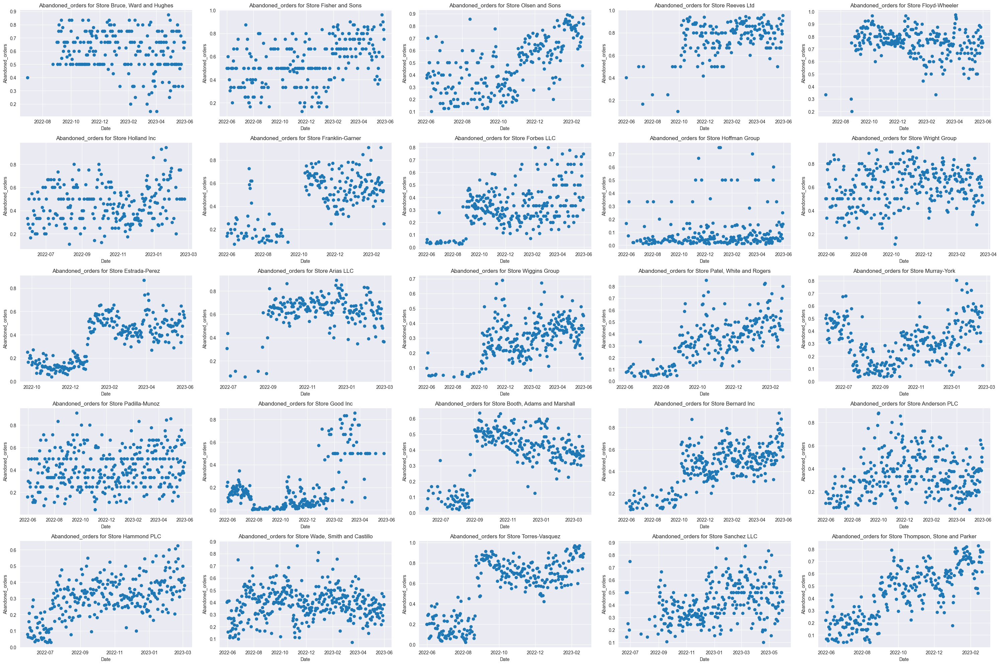

In [52]:
# We want to plot the Abandoned_orders for each top store in the last year since 31.05.2023
plot_kpi(Abandoned_orders,'Abandoned_orders',low_stores_Abandoned_orders)

In [53]:
# Let's do a feature extraction
Abandoned_orders = create_new_features(Abandoned_orders, 'Abandoned_orders')
Abandoned_orders = create_rolling_avg_columns(Abandoned_orders, 'Abandoned_orders')

In [54]:
# Let's describe the data
Abandoned_orders.describe()

,orders,abandeoned_checkout,all_checkouts,sum_total_discounts_in_abandeoned_checkout,shopify_plan_display_name,orders_revenue_usd,Abandoned_orders,datetime_year,datetime_month,datetime_dayofweek,quarter,holiday_effect,weekend,mean_Abandoned_orders_by_industry,mean_last_3_sample,mean_last_7_sample
count,15070.000000,15070.000000,15070.000000,1.507000e+04,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,14970.000000,14770.000000
mean,111.925282,28.505839,140.431121,1.041149e+06,2.751825,14309.131393,0.327375,3.292568,6.463172,2.979960,2.500265,-0.062865,0.281287,0.327375,0.328303,0.327887
std,337.111849,80.154275,365.433784,8.918618e+06,1.049882,43119.373168,0.266671,0.516055,3.743475,2.000099,1.194850,0.261286,0.449642,0.179898,0.257012,0.251431
min,1.000000,1.000000,2.000000,0.000000e+00,1.000000,0.000000,0.000149,1.000000,1.000000,0.000000,1.000000,-0.913605,0.000000,0.000149,0.000344,0.001189
25%,9.000000,2.000000,17.000000,0.000000e+00,2.000000,776.030400,0.071429,3.000000,3.000000,1.000000,1.000000,-0.056674,0.000000,0.182995,0.083167,0.091626
50%,26.000000,7.000000,42.000000,1.700000e+01,3.000000,2117.642382,0.289454,3.000000,6.000000,3.000000,2.000000,-0.040092,0.000000,0.321579,0.304220,0.310415
75%,71.000000,22.000000,101.000000,1.119375e+02,4.000000,7550.887500,0.507519,4.000000,10.000000,5.000000,4.000000,-0.040092,1.000000,0.452791,0.509069,0.504287
max,7858.000000,1613.000000,7910.000000,2.358876e+08,4.000000,856264.712400,0.994048,4.000000,12.000000,6.000000,4.000000,1.424016,1.000000,0.994048,1.601165,1.401761


In [55]:
Abandoned_orders.columns

Index(['date', 'orders', 'abandeoned_checkout', 'all_checkouts',
       'sum_total_discounts_in_abandeoned_checkout', 'currency', 'store_id',
       'industry', 'country', 'shopify_plan_display_name', 'store_name',
       'orders_revenue_usd', 'Abandoned_orders', 'datetime_year',
       'datetime_month', 'datetime_dayofweek', 'quarter',
       'less_than_2_weeks_before_holiday', 'holiday_effect', 'holiday_bins',
       'weekend', 'mean_Abandoned_orders_by_industry', 'mean_last_3_sample',
       'mean_last_7_sample'],
      dtype='object')

In [56]:
# The following function creates a dummy column for each option of the dates categorical variables
normal_Abandoned_orders = process_dummies_features(Abandoned_orders)
# Let's drop the null values in the data set
normal_Abandoned_orders = normal_Abandoned_orders.dropna()
normal_Abandoned_orders.shape

(14770, 35)

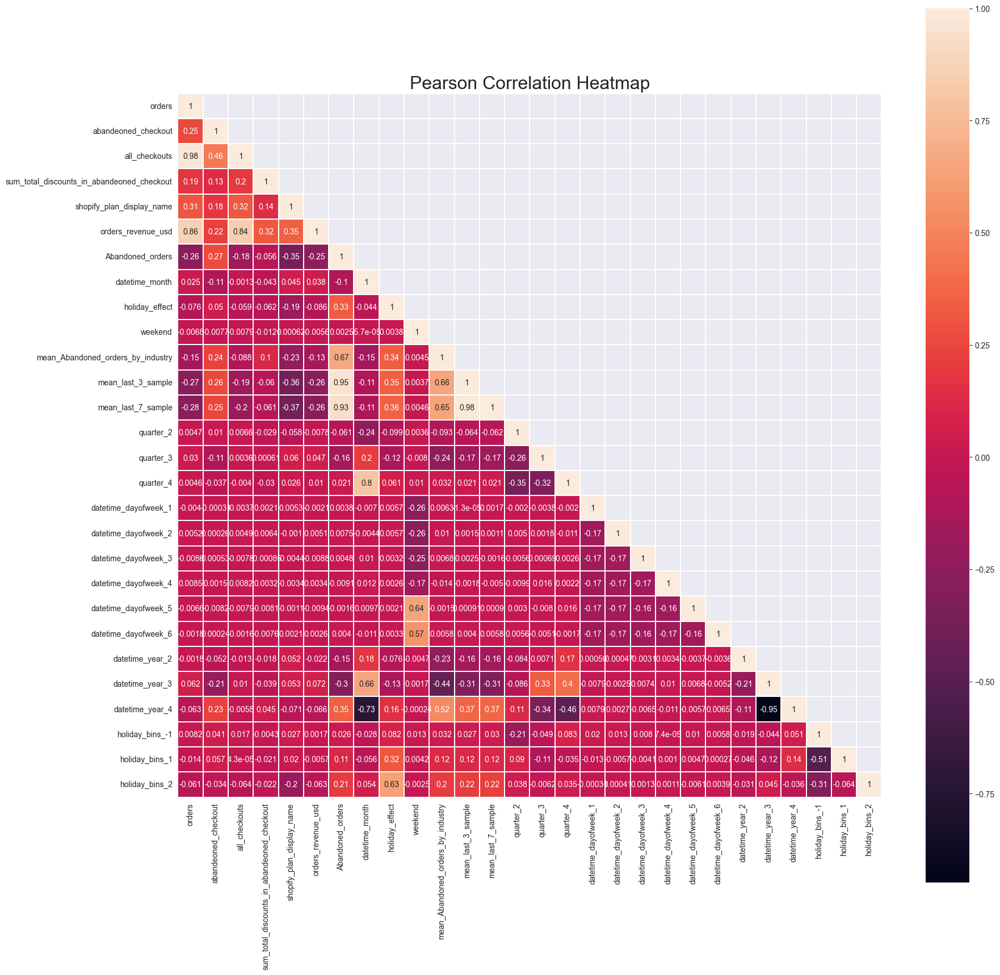

In [57]:
# Let's check the correlation between the numeric features
pearson_corr_heatmap(normal_Abandoned_orders)

In [58]:
# We choose these columns for our models or for save some of them to the report
Abandoned_orders_columns = ['store_id','date','weekend','holiday_bins_-1', 'holiday_bins_1', 'holiday_bins_2','Abandoned_orders','store_name','orders_revenue_usd','less_than_2_weeks_before_holiday','mean_Abandoned_orders_by_industry','industry']
Abandoned_orders_X = normal_Abandoned_orders[Abandoned_orders_columns]
Abandoned_orders_X

,store_id,date,weekend,holiday_bins_-1,holiday_bins_1,holiday_bins_2,Abandoned_orders,store_name,orders_revenue_usd,less_than_2_weeks_before_holiday,mean_Abandoned_orders_by_industry,industry
210,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,2022-03-21,0,1,0,0,0.016393,"Harrison, Davidson and Weaver",4165.410000,Regular Day,0.009243,COSMETICS
209,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,2022-03-22,0,1,0,0,0.010309,"Harrison, Davidson and Weaver",6671.940000,Regular Day,0.006243,COSMETICS
208,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,2022-03-25,0,1,0,0,0.023256,"Harrison, Davidson and Weaver",3320.720000,Regular Day,0.012810,COSMETICS
207,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,2022-03-28,0,1,0,0,0.018868,"Harrison, Davidson and Weaver",4270.830000,Regular Day,0.010643,COSMETICS
206,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,2022-04-02,1,1,0,0,0.017241,"Harrison, Davidson and Weaver",4494.510000,Regular Day,0.009989,COSMETICS
...,...,...,...,...,...,...,...,...,...,...,...,...
14843,fd8ce804-305e-4c57-bfc5-04934952275d,2023-02-18,1,0,1,0,0.547619,Thompson LLC,3352.673748,Family Day,0.522971,APPAREL_AND_FASHION
14842,fd8ce804-305e-4c57-bfc5-04934952275d,2023-02-19,1,0,1,0,0.542636,Thompson LLC,5736.567798,Family Day,0.558626,APPAREL_AND_FASHION
14841,fd8ce804-305e-4c57-bfc5-04934952275d,2023-02-20,0,0,1,0,0.512397,Thompson LLC,5486.937705,Family Day,0.550620,APPAREL_AND_FASHION
14840,fd8ce804-305e-4c57-bfc5-04934952275d,2023-02-21,0,1,0,0,0.518987,Thompson LLC,4047.732955,Regular Day,0.543935,APPAREL_AND_FASHION


split the data

In [317]:
from sklearn.model_selection import train_test_split
Abandoned_orders_train, Abandoned_orders_val =  split_data_by_store(Abandoned_orders_X)

In [318]:
print('x_train shape:', Abandoned_orders_train.shape)
print('y_train shape:', Abandoned_orders_val.shape)

x_train shape: (13565, 12)
y_train shape: (1205, 12)


## Models

In [451]:
# We create 3 dicts one for each model, so the keys in the dict is the store id and the value is the model.
pca_Abandoned_orders_with_anomaly_concat_train = pd.DataFrame()
Isolation_Forsest_Abandoned_orders_with_anomaly_concat_train = pd.DataFrame()
lof_Abandoned_orders_with_anomaly_concat_train = pd.DataFrame()

pca_Abandoned_orders_with_anomaly_concat_val = pd.DataFrame()
Isolation_Forsest_Abandoned_orders_with_anomaly_concat_val = pd.DataFrame()
lof_Abandoned_orders_with_anomaly_concat_val = pd.DataFrame()

Abandoned_orders_pca_dict = {}
Abandoned_orders_Isolation_Forsest_dict = {}
Abandoned_orders_lof_dict = {}

In [452]:
for store in Abandoned_orders_stores:
    data_train = Abandoned_orders_train[(Abandoned_orders_train['store_name'] == store)]
    data_val = Abandoned_orders_val[(Abandoned_orders_val['store_name'] == store)]

    pca_Abandoned_orders_with_anomaly_train,pca_Abandoned_orders_with_anomaly_val = model_anomaly_detection('pca',data_train,data_val,'Abandoned_orders',0.01,4)
    pca_Abandoned_orders_with_anomaly_concat_train = pd.concat([pca_Abandoned_orders_with_anomaly_concat_train,pca_Abandoned_orders_with_anomaly_train],axis = 0)
    pca_Abandoned_orders_with_anomaly_concat_val = pd.concat([pca_Abandoned_orders_with_anomaly_concat_val,pca_Abandoned_orders_with_anomaly_val],axis = 0)

    Isolation_Forsest_Abandoned_orders_with_anomaly_train,Isolation_Forsest_Abandoned_orders_with_anomaly_val = model_anomaly_detection('Isolation_Forsest',data_train,data_val,'Abandoned_orders',0.01,40)
    Isolation_Forsest_Abandoned_orders_with_anomaly_concat_train = pd.concat([Isolation_Forsest_Abandoned_orders_with_anomaly_concat_train,Isolation_Forsest_Abandoned_orders_with_anomaly_train],axis = 0)
    Isolation_Forsest_Abandoned_orders_with_anomaly_concat_val = pd.concat([Isolation_Forsest_Abandoned_orders_with_anomaly_concat_val,Isolation_Forsest_Abandoned_orders_with_anomaly_val],axis = 0)

    lof_Abandoned_orders_with_anomaly_train,lof_Abandoned_orders_with_anomaly_val = model_anomaly_detection('lof',data_train,data_val,'Abandoned_orders',0.01,20)
    lof_Abandoned_orders_with_anomaly_concat_train = pd.concat([lof_Abandoned_orders_with_anomaly_concat_train,lof_Abandoned_orders_with_anomaly_train],axis = 0)
    lof_Abandoned_orders_with_anomaly_concat_val = pd.concat([lof_Abandoned_orders_with_anomaly_concat_val,lof_Abandoned_orders_with_anomaly_val],axis = 0)

PCA Prediction

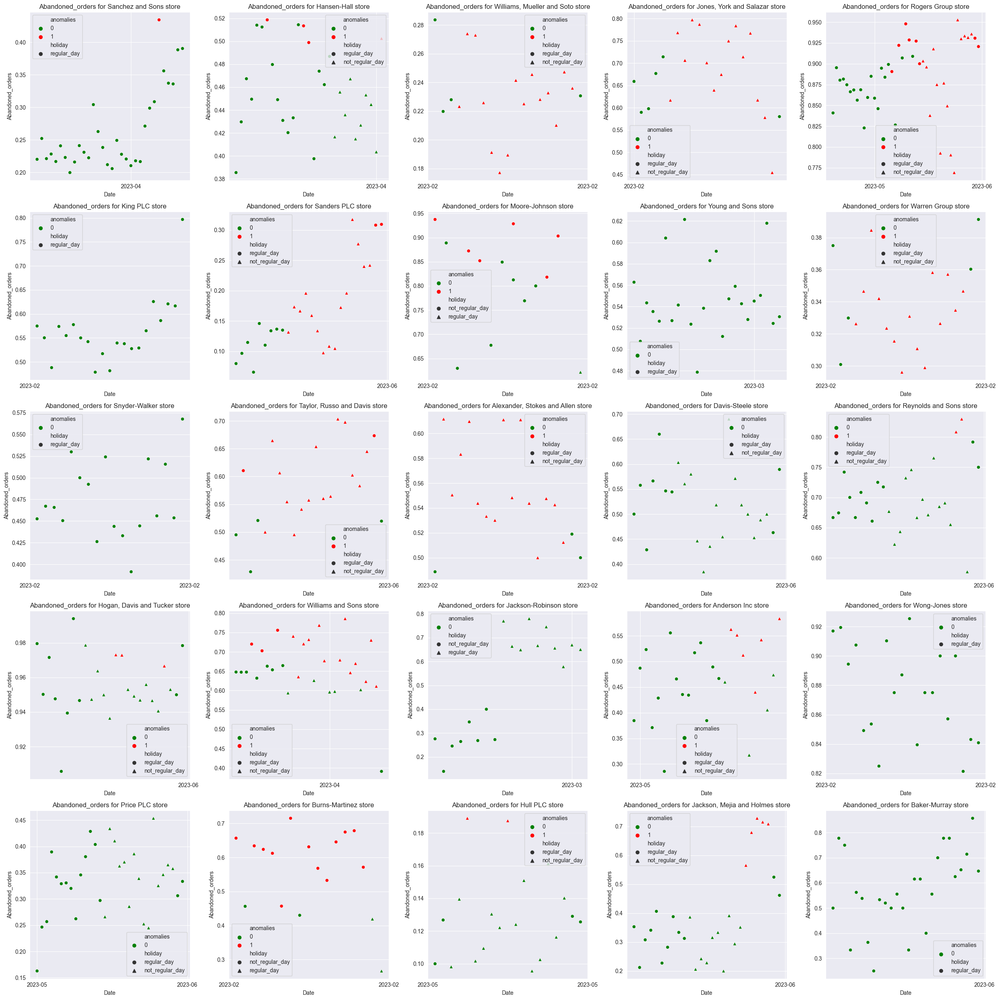

In [453]:
# Plot the PCA prediction for top stores for Abandoned_orders 
plot_anomalies(pca_Abandoned_orders_with_anomaly_concat_val,'Abandoned_orders',top_stores_Abandoned_orders)

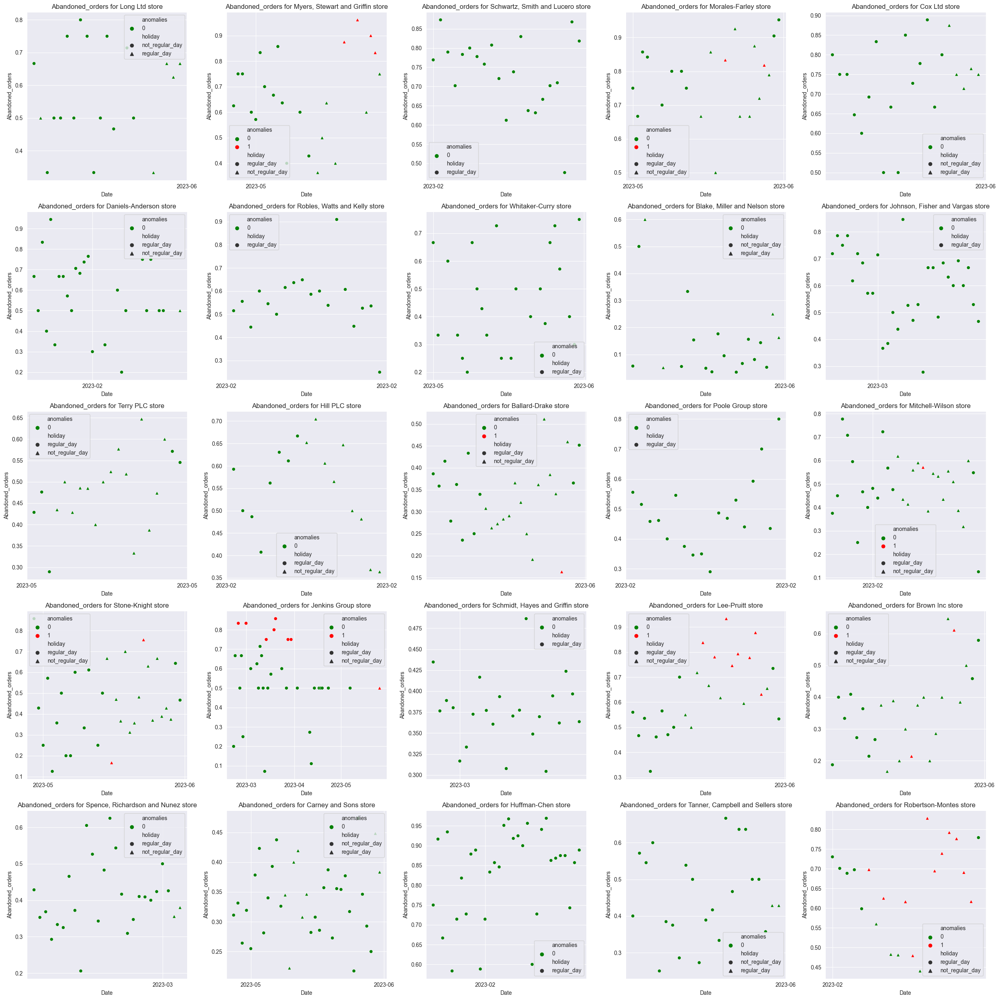

In [454]:
# Plot the PCA prediction for low stores for Abandoned_orders 
plot_anomalies(pca_Abandoned_orders_with_anomaly_concat_val,'Abandoned_orders',low_stores_Abandoned_orders)

Isolation_Forsest Prediction

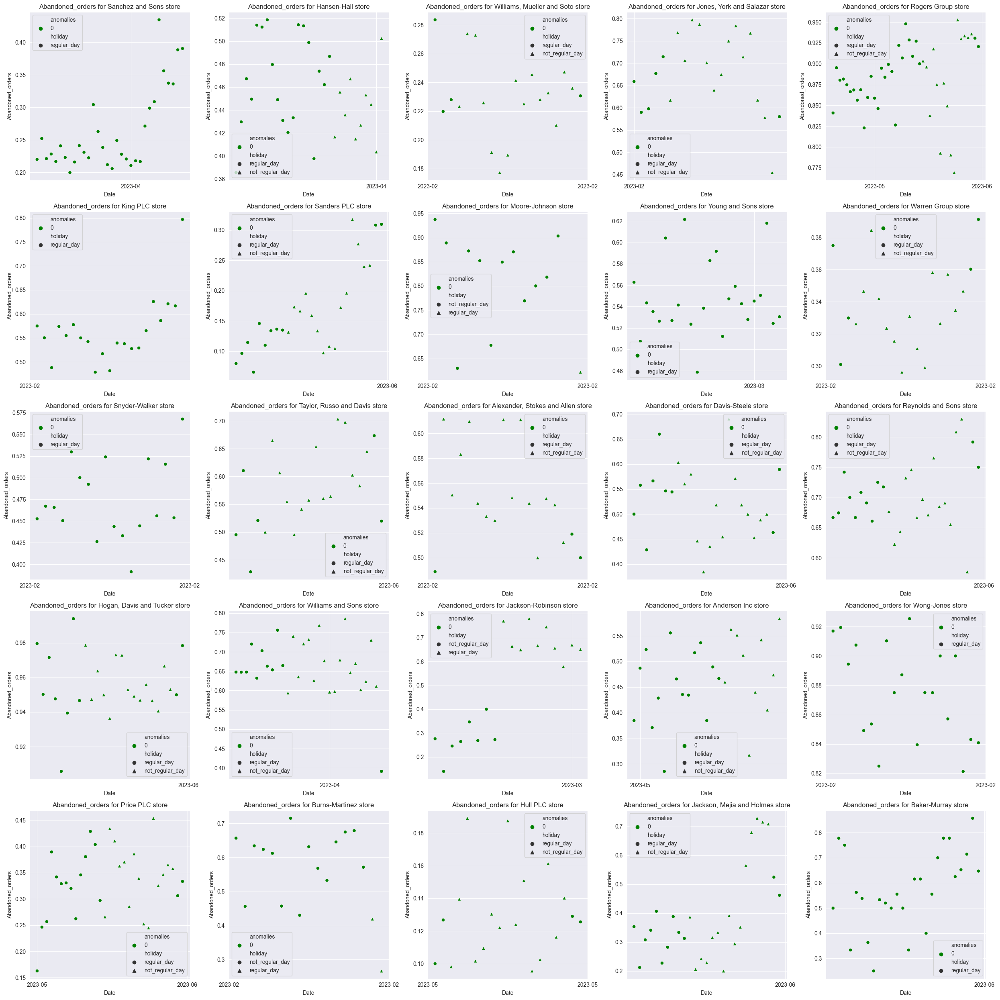

In [455]:
# Plot the Isolation_Forsest prediction for top stores for Abandoned_orders 
plot_anomalies(Isolation_Forsest_Abandoned_orders_with_anomaly_concat_val,'Abandoned_orders',top_stores_Abandoned_orders)

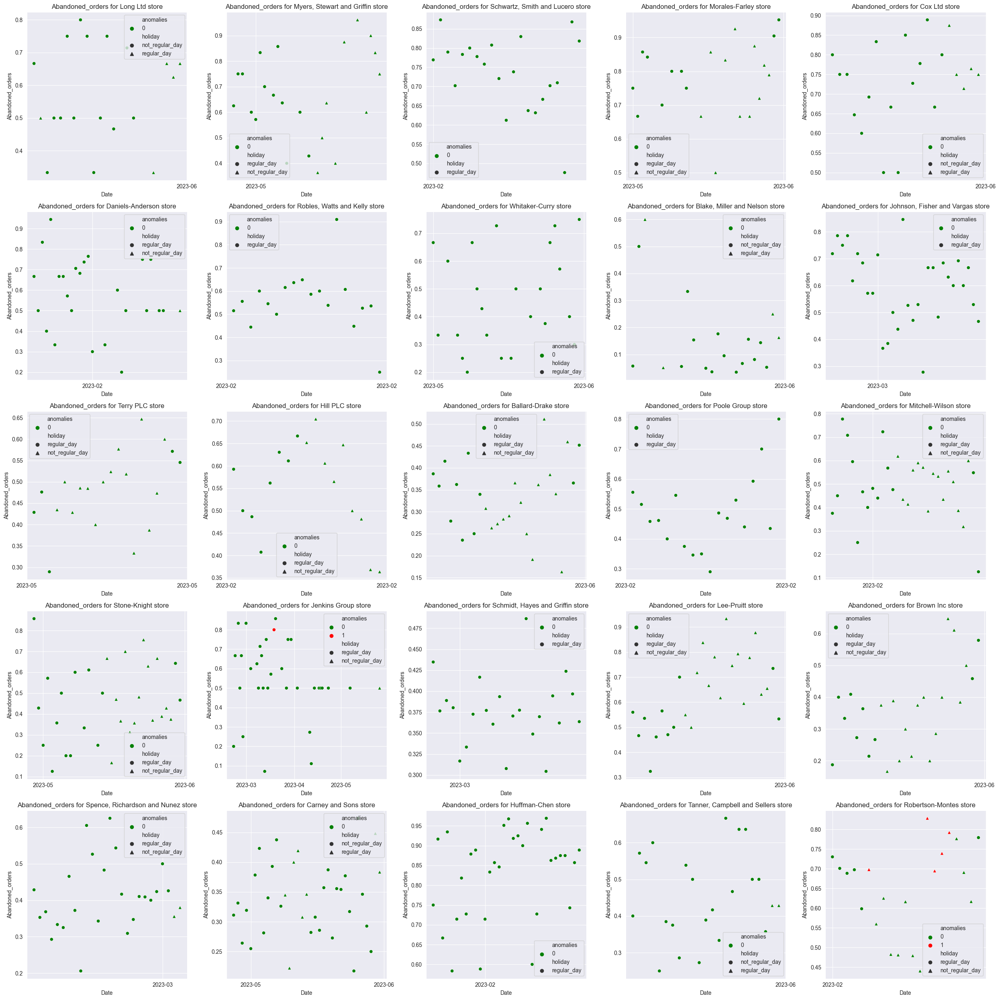

In [456]:
# Plot the Isolation_Forsest prediction for low stores for Abandoned_orders 
plot_anomalies(Isolation_Forsest_Abandoned_orders_with_anomaly_concat_val,'Abandoned_orders',low_stores_Abandoned_orders)

LOF Prediction

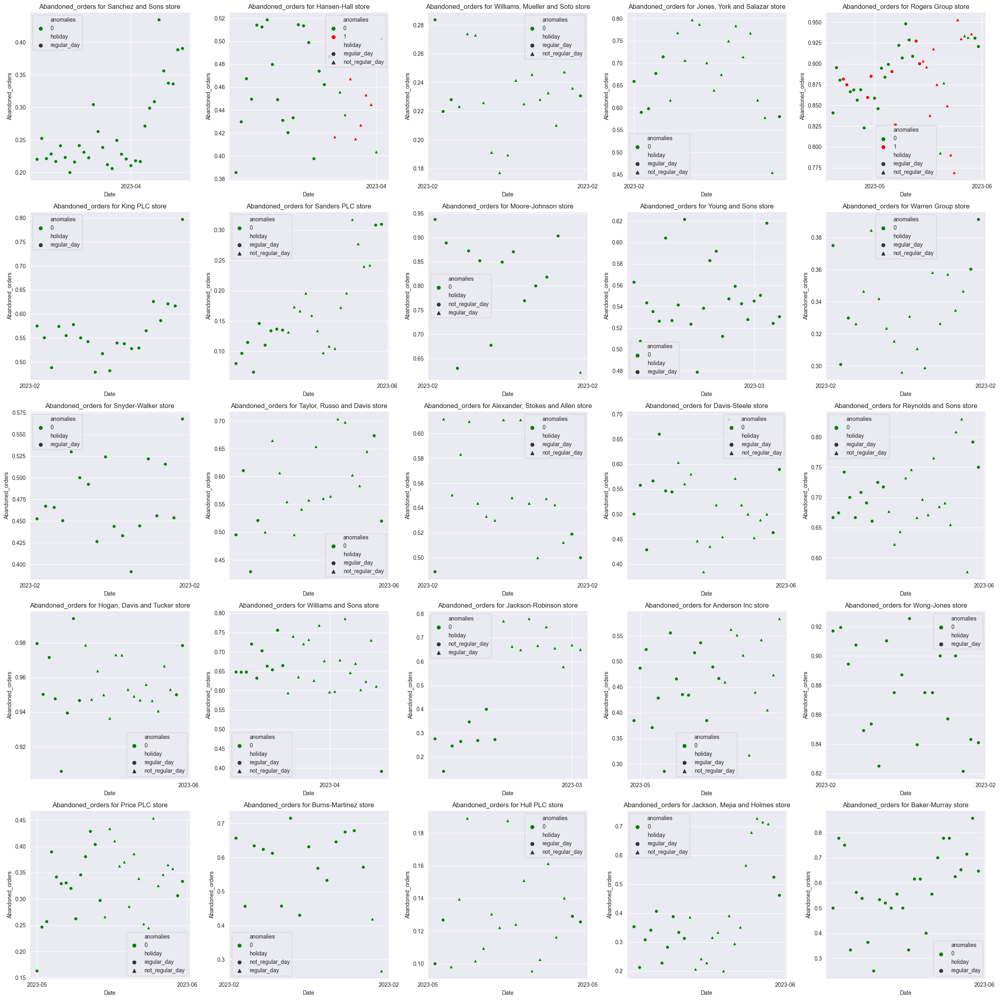

In [457]:
# Plot the LOF prediction for top stores for Abandoned_orders 
plot_anomalies(lof_Abandoned_orders_with_anomaly_concat_val,'Abandoned_orders',top_stores_Abandoned_orders)

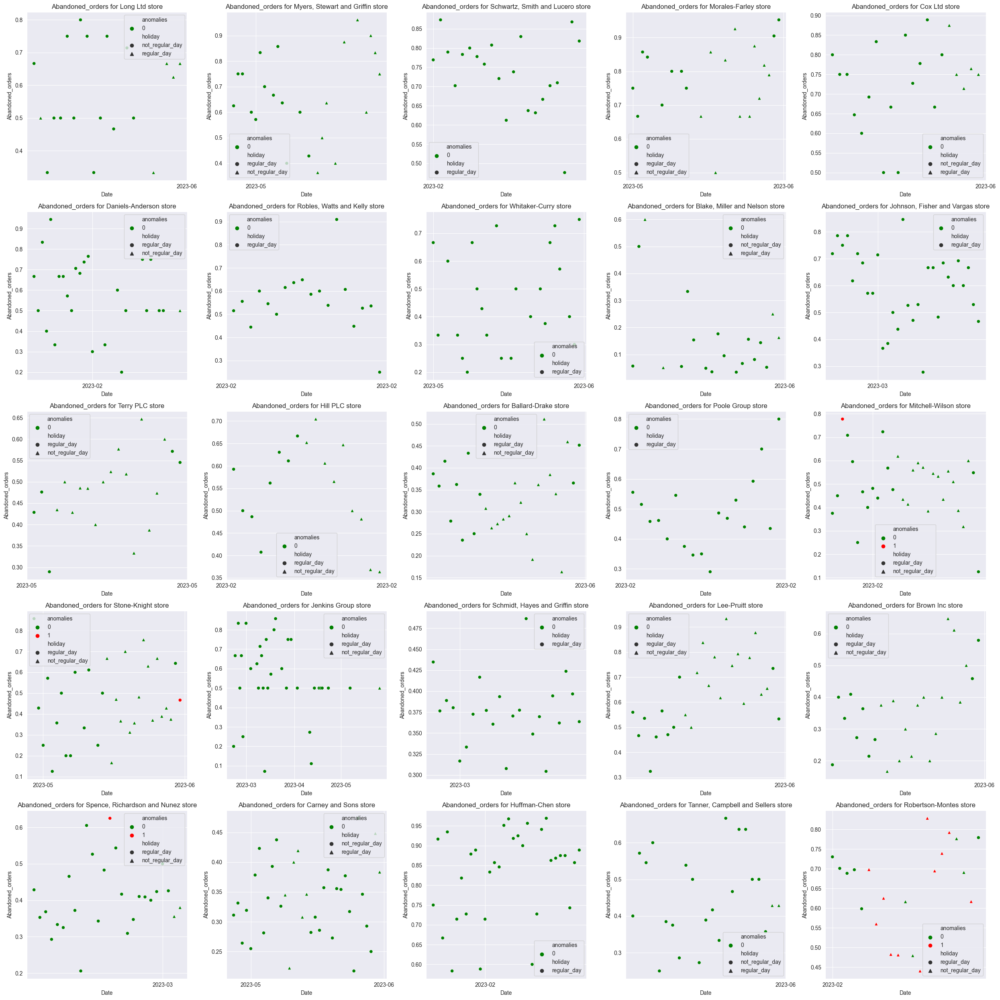

In [458]:
# Plot the LOF prediction for low stores for Abandoned_orders 
plot_anomalies(lof_Abandoned_orders_with_anomaly_concat_val,'Abandoned_orders',low_stores_Abandoned_orders)

## pre-processing test data and prediction

In [327]:
# Let's do the same pre processing that we did in train set for the test set.
Abandoned_orders_test = pre_processing_test(Abandoned_orders_train,Abandoned_orders_test, Abandoned_orders_stores, Abandoned_orders_columns, dict_holiday_effect_Abandoned_orders,'Abandoned_orders')

In [328]:
Abandoned_orders_X

,store_id,date,weekend,holiday_bins_-1,holiday_bins_1,holiday_bins_2,Abandoned_orders,store_name,orders_revenue_usd,less_than_2_weeks_before_holiday,mean_Abandoned_orders_by_industry,industry
12072,dee54568-75a5-4208-8f9a-cd4e177fb2ad,2021-07-12,0,1,0,0,0.055556,Price PLC,250.340000,Regular Day,0.055556,APPAREL_AND_FASHION
12071,dee54568-75a5-4208-8f9a-cd4e177fb2ad,2021-07-16,0,1,0,0,0.074074,Price PLC,1281.600000,Regular Day,0.074074,APPAREL_AND_FASHION
12070,dee54568-75a5-4208-8f9a-cd4e177fb2ad,2021-07-20,0,1,0,0,0.015385,Price PLC,3072.950000,Regular Day,0.015385,APPAREL_AND_FASHION
7038,662c8e84-d4f2-484b-9250-bca01a3aaf71,2021-07-21,0,1,0,0,0.026316,"Jackson, Mejia and Holmes",3718.420000,Regular Day,0.026316,OTHER
12069,dee54568-75a5-4208-8f9a-cd4e177fb2ad,2021-07-21,0,1,0,0,0.050000,Price PLC,1730.430000,Regular Day,0.050000,APPAREL_AND_FASHION
...,...,...,...,...,...,...,...,...,...,...,...,...
217,0675daf4-d17c-4965-bdce-c3289574b557,2023-05-31,0,1,0,0,0.920649,Rogers Group,6651.980000,Regular Day,0.580889,APPAREL_AND_FASHION
12662,e259fb48-0be0-4473-8e22-f482cc2ce1f5,2023-05-31,0,1,0,0,0.309353,Sanders PLC,5204.880000,Regular Day,0.580889,APPAREL_AND_FASHION
2874,311540e1-c938-4c2c-94a7-f57b0a136fc0,2023-05-31,0,1,0,0,0.466667,Stone-Knight,1114.050000,Regular Day,0.580889,APPAREL_AND_FASHION
12079,dfedb657-9c81-46a8-b9d6-1647282a6f73,2023-05-31,0,1,0,0,0.451613,Ballard-Drake,1730.390000,Regular Day,0.461733,HEALTH_AND_SUPPLEMENTS


In [440]:
# After we choose the best model, let's fit it on all the train set.
final_Abandoned_orders_X = pd.DataFrame()

for store in Abandoned_orders_stores:
    data = Abandoned_orders_X[(Abandoned_orders_X['store_name'] == store)]
    model, dim, df_train = model_anomaly_detection_for_train_and_validation('lof',data,'Abandoned_orders',0.001,20)
    final_Abandoned_orders_X = pd.concat([final_Abandoned_orders_X,df_train],axis = 0)
    Abandoned_orders_Isolation_Forsest_dict[store] = (model,dim)

In [441]:
# Save the datasets for creating the report
final_Abandoned_orders_X.to_csv("Abandoned_orders_X.csv")
Abandoned_orders_test.to_csv("Abandoned_orders_test.csv")

In [442]:
# Write the dictionary to a file and save the dict of the models
with open('my_dict_Abandoned_orders.pkl', 'wb') as f:
    pickle.dump(Abandoned_orders_Isolation_Forsest_dict, f)

# Conversion_Rate_orders

In [59]:
Conversion_Rate_orders

,Unnamed: 0,date,currency,orders_revenue,store_id,industry,country,shopify_plan_display_name,sum_all_visits,sum_transaction,store_name
0,0,2020-06-30,USD,19.85,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,NaN,Osborn-Bullock
1,1,2020-07-01,USD,53.16,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,NaN,Osborn-Bullock
2,2,2020-07-02,USD,79.90,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,NaN,Osborn-Bullock
3,3,2020-07-03,USD,62.99,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,NaN,Osborn-Bullock
4,4,2020-07-06,USD,36.96,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,NaN,Osborn-Bullock
...,...,...,...,...,...,...,...,...,...,...,...
89565,409,2023-02-18,NZD,1224.12,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,128.0,0.0,Hammond Group
89566,410,2023-02-19,NZD,1634.52,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,153.0,0.0,Hammond Group
89567,411,2023-02-20,NZD,639.73,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,140.0,0.0,Hammond Group
89568,412,2023-02-21,NZD,1019.50,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,125.0,0.0,Hammond Group


In [60]:
# Let's convert the date colmun to tyoe of date
Conversion_Rate_orders['date'] = pd.to_datetime(Conversion_Rate_orders['date'])

In [61]:
# We drop the stores from Tanzania and drop the null values, and finaly we choose the 50 largest stores in Conversion_Rate_orders dataset.
Conversion_Rate_orders = Conversion_Rate_orders[Conversion_Rate_orders['country'] != 'Tanzania, United Republic Of']
Conversion_Rate_orders = Conversion_Rate_orders.dropna()
Conversion_Rate_orders_stores = select_stores(Conversion_Rate_orders)

In [62]:
# We choose only the samples that happend in the last 3 years.
Conversion_Rate_orders = filter_df(Conversion_Rate_orders,Conversion_Rate_orders_stores)
Conversion_Rate_orders

,Unnamed: 0,date,currency,orders_revenue,store_id,industry,country,shopify_plan_display_name,sum_all_visits,sum_transaction,store_name
1600,0,2022-01-07,USD,4485.66,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1627.0,53.0,"Harrison, Davidson and Weaver"
1601,1,2022-01-08,USD,2506.27,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1304.0,35.0,"Harrison, Davidson and Weaver"
1602,2,2022-01-09,USD,3462.25,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1339.0,48.0,"Harrison, Davidson and Weaver"
1603,3,2022-01-10,USD,2313.34,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1309.0,37.0,"Harrison, Davidson and Weaver"
1604,4,2022-01-11,USD,2804.72,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1600.0,26.0,"Harrison, Davidson and Weaver"
...,...,...,...,...,...,...,...,...,...,...,...
89565,409,2023-02-18,NZD,1224.12,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,128.0,0.0,Hammond Group
89566,410,2023-02-19,NZD,1634.52,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,153.0,0.0,Hammond Group
89567,411,2023-02-20,NZD,639.73,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,140.0,0.0,Hammond Group
89568,412,2023-02-21,NZD,1019.50,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,125.0,0.0,Hammond Group


In [63]:
# We convert the revenue of all the stores to dollar currency.
Conversion_Rate_orders = handle_currency(Conversion_Rate_orders,'orders_revenue')

In [64]:
# Get the 25 highest profitable stores
top_stores_Conversion_Rate_orders = Conversion_Rate_orders.groupby('store_id')['orders_revenue_usd'].sum().nlargest(25).index
# Get the 25 lowest profitable stores
low_stores_Conversion_Rate_orders = Conversion_Rate_orders.groupby('store_id')['orders_revenue_usd'].sum().nsmallest(25).index

In [65]:
# Let's calculate the Conversion_Rate_orders KPI
Conversion_Rate_orders['Conversion_Rate_orders']=Conversion_Rate_orders['sum_transaction']/Conversion_Rate_orders['sum_all_visits']
Conversion_Rate_orders

,Unnamed: 0,date,currency,store_id,industry,country,shopify_plan_display_name,sum_all_visits,sum_transaction,store_name,orders_revenue_usd,Conversion_Rate_orders
1600,0,2022-01-07,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1627.0,53.0,"Harrison, Davidson and Weaver",4485.660000,0.032575
1601,1,2022-01-08,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1304.0,35.0,"Harrison, Davidson and Weaver",2506.270000,0.026840
1602,2,2022-01-09,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1339.0,48.0,"Harrison, Davidson and Weaver",3462.250000,0.035848
1603,3,2022-01-10,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1309.0,37.0,"Harrison, Davidson and Weaver",2313.340000,0.028266
1604,4,2022-01-11,USD,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1600.0,26.0,"Harrison, Davidson and Weaver",2804.720000,0.016250
...,...,...,...,...,...,...,...,...,...,...,...,...
89565,409,2023-02-18,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,128.0,0.0,Hammond Group,758.709811,0.000000
89566,410,2023-02-19,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,153.0,0.0,Hammond Group,1013.075810,0.000000
89567,411,2023-02-20,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,140.0,0.0,Hammond Group,396.504777,0.000000
89568,412,2023-02-21,NZD,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,125.0,0.0,Hammond Group,631.886296,0.000000


In [66]:
# Let's split the date column to year,quater,month and day of week.
Conversion_Rate_orders = time_process(Conversion_Rate_orders)

In [67]:
# Apply the handling_shopify_plan_and_year that rank these columns
Conversion_Rate_orders = handling_shopify_plan_and_year(Conversion_Rate_orders)

In [68]:
# For each date we determine if it is before holiday or not. 
Conversion_Rate_orders['less_than_2_weeks_before_holiday'] = Conversion_Rate_orders[['date', 'country']].apply(lambda row: is_within_two_weeks_of_holiday(row['date'], row['country']), axis=1)

In [69]:
# For each holiday we check the effect on the Conversion_Rate_orders.
Conversion_Rate_orders['holiday_effect'],dict_holiday_effect_Conversion_Rate = holiday_effect(Conversion_Rate_orders,'Conversion_Rate_orders')

In [70]:
# We want to group by the holidays's impact on the KPI, so we created bins with positive and negative effects with two levels each.

bins = [-1, -0.15, 0, 0.11, 2]
labels = [-2, -1, 1, 2]  # Assign labels -2, -1, 1, 2 to the respective bins

# Use pd.cut to bin the 'holiday_effect' column and replace the values with the corresponding labels
Conversion_Rate_orders['holiday_bins'] = pd.cut(Conversion_Rate_orders['holiday_effect'], bins=bins, labels=labels)
Conversion_Rate_orders['holiday_bins'].value_counts()

1     16750
2      4207
-1     1270
-2     1039
Name: holiday_bins, dtype: int64

In [71]:
# Apply the is_weekend function to the date and country columns
Conversion_Rate_orders['weekend'] = Conversion_Rate_orders[['datetime_dayofweek', 'country']].apply(lambda row: is_weekend(row['datetime_dayofweek'], row['country']), axis=1)

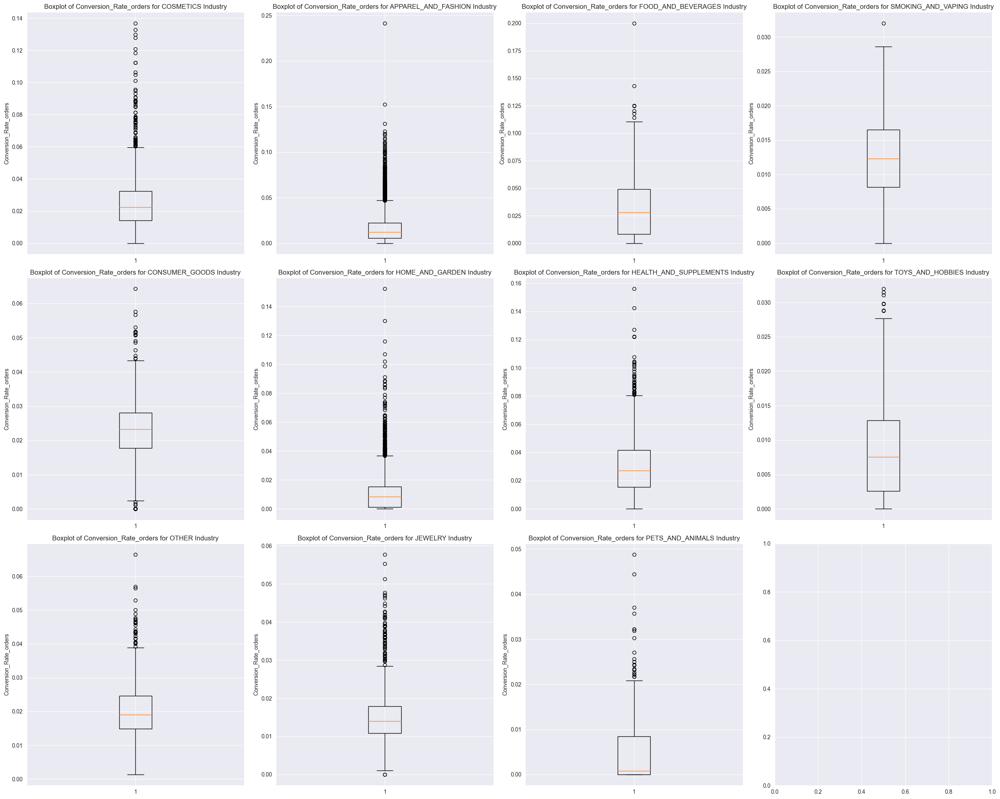

In [72]:
# Boxplot for Conversion_Rate_orders for each industry.
boxplot(Conversion_Rate_orders,'Conversion_Rate_orders')

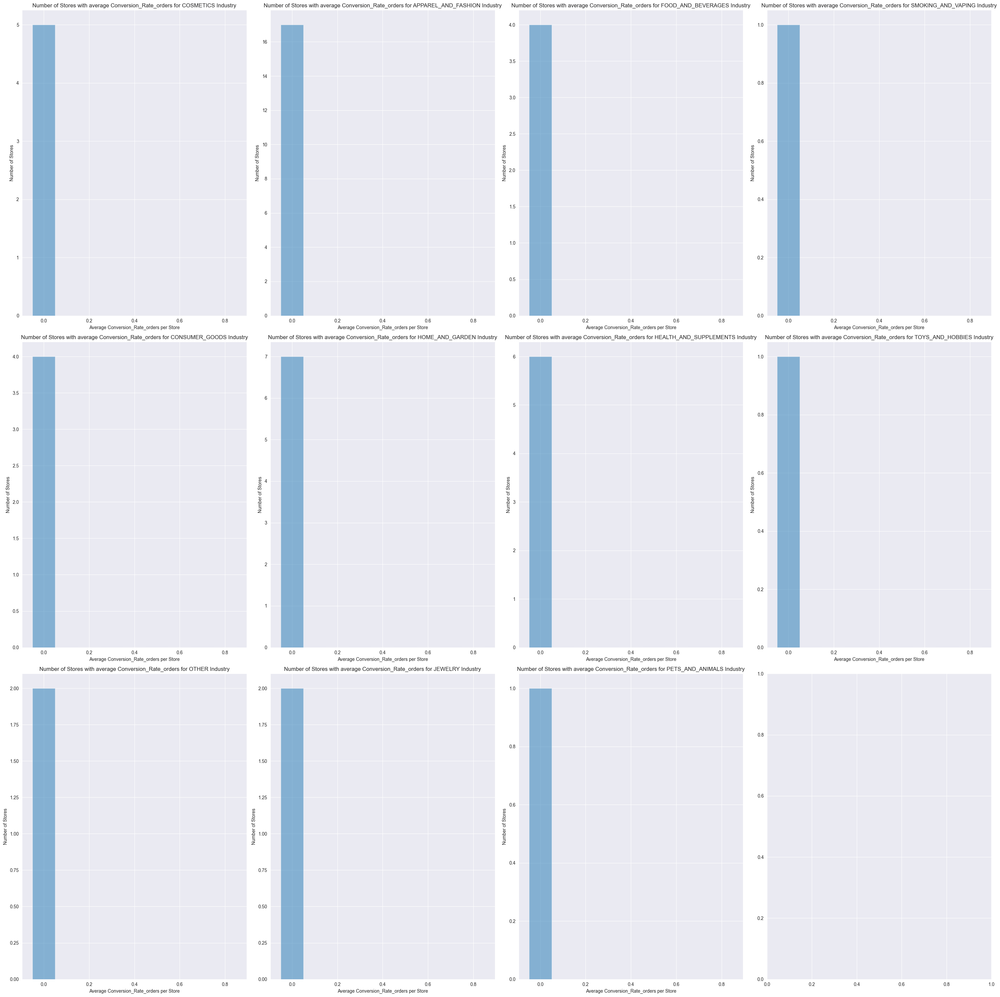

In [73]:
# We want to check how many stores there are in each industry and how the Conversion_Rate_orders divides by ten bins.
hist_stores(Conversion_Rate_orders,'Conversion_Rate_orders')

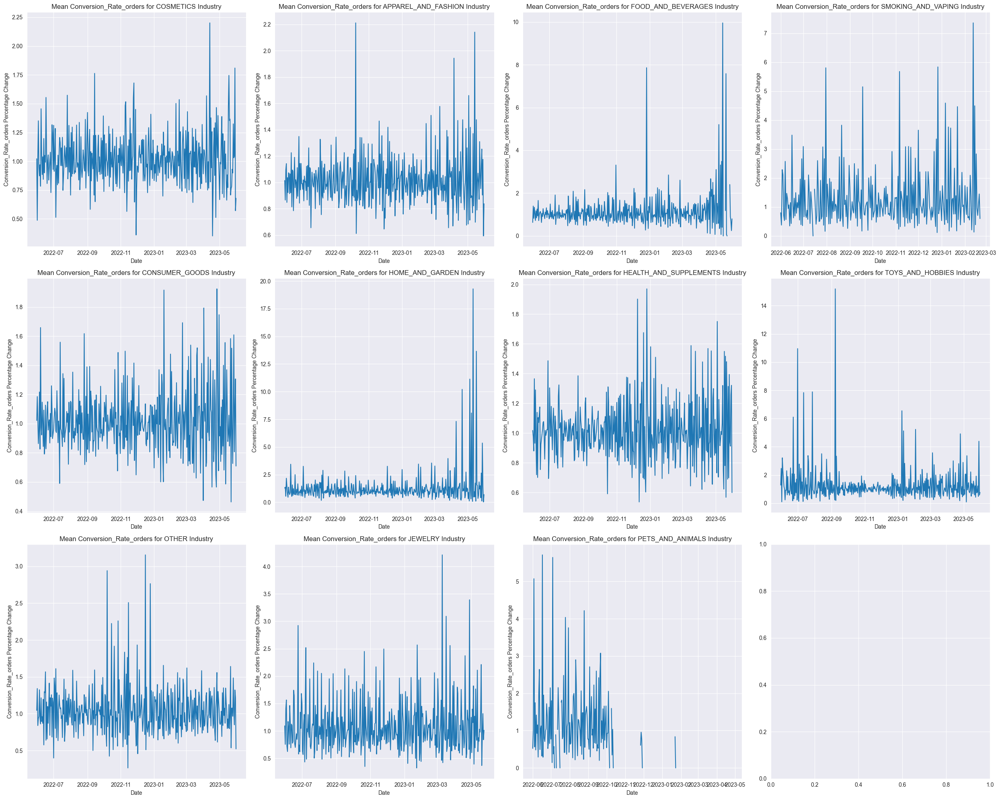

In [74]:
# We want to see the mean change of the Conversion_Rate_orders with the day before for each date and industry
mean_kpi_change(Conversion_Rate_orders,'Conversion_Rate_orders')

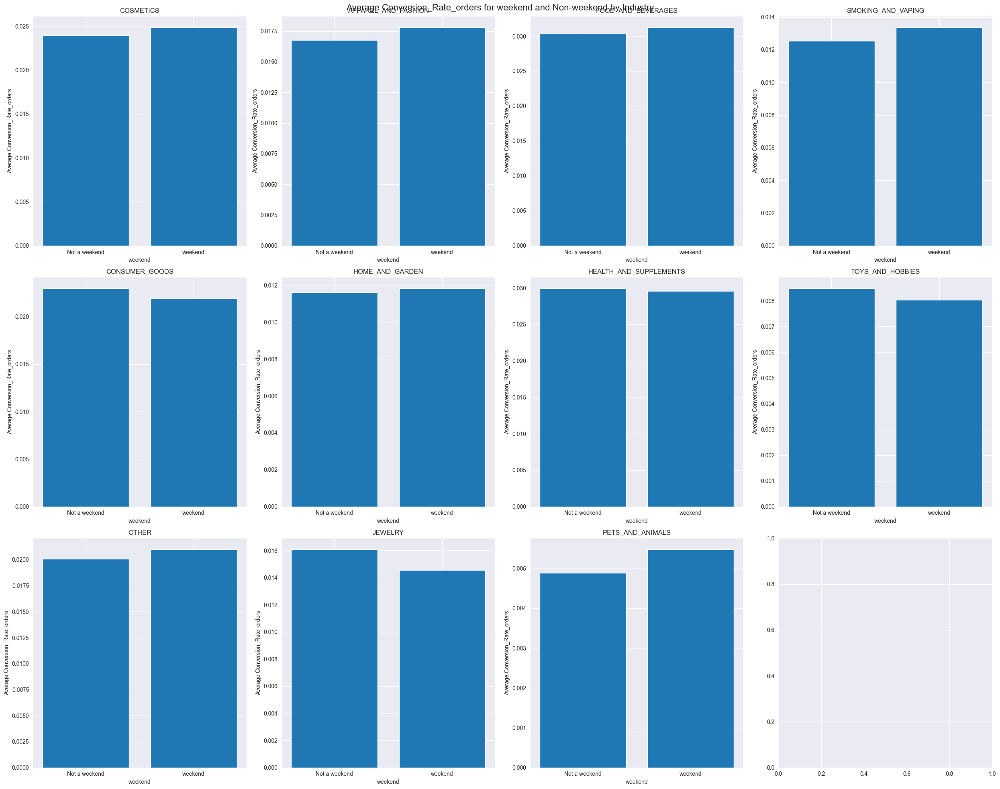

In [75]:
# We want to check the diffrences in the Conversion_Rate_orders between days that in weekend and days aren't for each industry.
kpi_weekend_vs_not(Conversion_Rate_orders,'Conversion_Rate_orders')

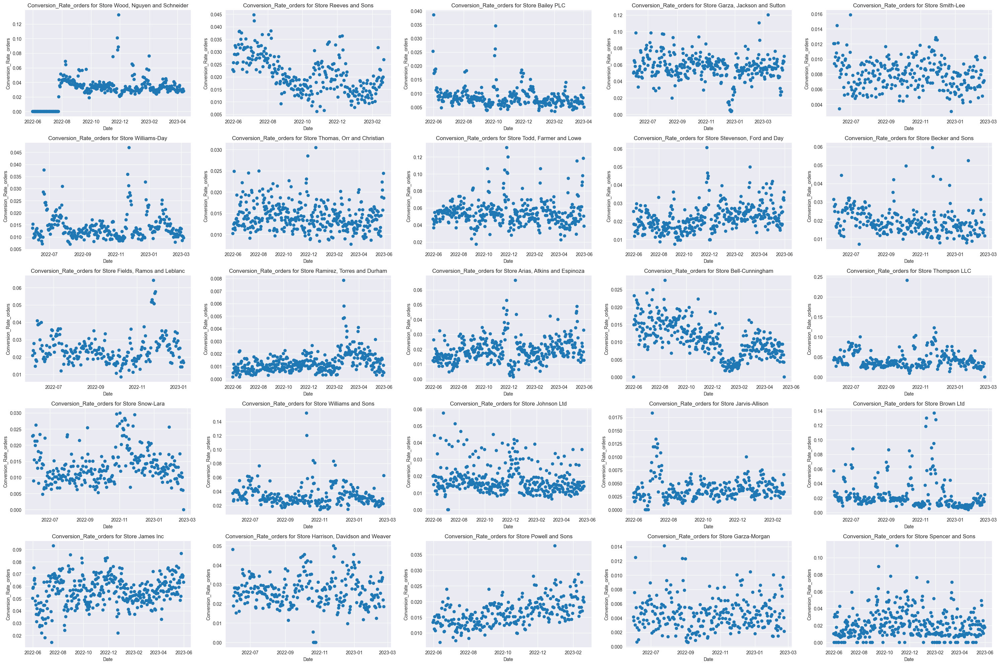

In [76]:
# We want to plot the Conversion_Rate_orders for each top store in the last year since 31.05.2023
plot_kpi(Conversion_Rate_orders,'Conversion_Rate_orders',top_stores_Conversion_Rate_orders)

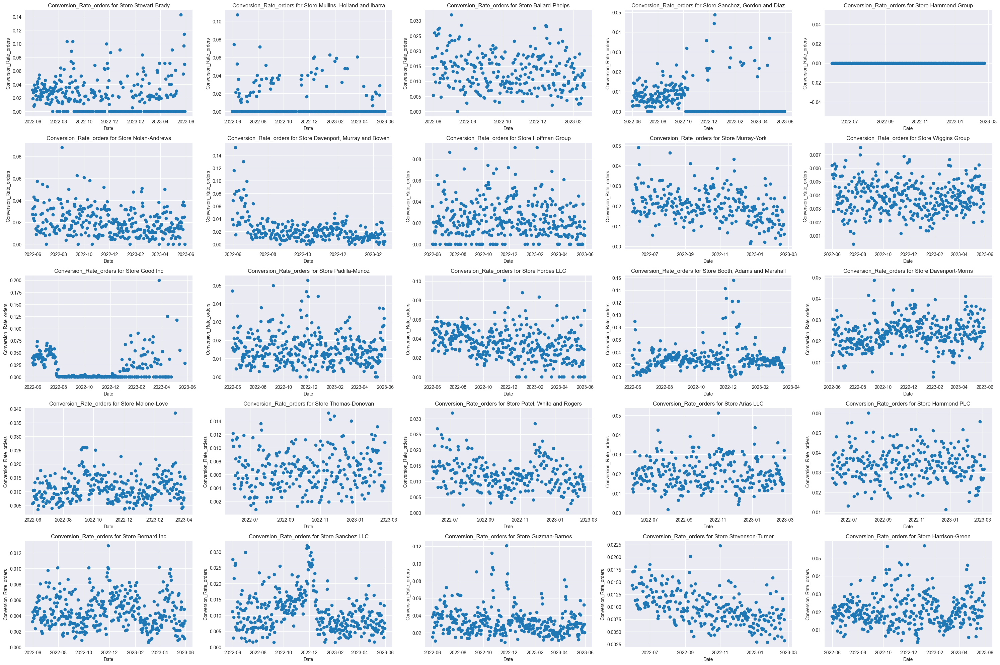

In [77]:
# We want to plot the Conversion_Rate_orders for each low store in the last year since 31.05.2023
plot_kpi(Conversion_Rate_orders,'Conversion_Rate_orders',low_stores_Conversion_Rate_orders)

In [78]:
# Let's do a feature extraction
Conversion_Rate_orders = create_new_features(Conversion_Rate_orders,'Conversion_Rate_orders')
Conversion_Rate_orders = create_rolling_avg_columns(Conversion_Rate_orders, 'Conversion_Rate_orders')

In [79]:
# Let's describe the data
Conversion_Rate_orders.describe()

,shopify_plan_display_name,sum_all_visits,sum_transaction,orders_revenue_usd,Conversion_Rate_orders,datetime_year,datetime_month,datetime_dayofweek,quarter,holiday_effect,weekend,mean_Conversion_Rate_orders_by_industry,mean_last_3_sample,mean_last_7_sample
count,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23266.000000,23161.000000,22950.000000
mean,2.952506,3593.796613,60.722084,12344.619354,0.019617,3.204118,5.837961,2.997593,2.287587,0.109862,0.285524,0.019617,0.020897,0.020865
std,1.031015,7578.708481,159.371744,37525.884574,0.017531,0.428796,3.512338,2.002726,1.130792,0.188245,0.451673,0.008934,0.018570,0.017725
min,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,1.000000,-0.861423,0.000000,0.000000,0.000000,0.000000
25%,2.000000,506.000000,6.000000,804.812524,0.007141,3.000000,3.000000,1.000000,1.000000,0.103376,0.000000,0.014504,0.008302,0.008821
50%,3.000000,1384.000000,19.000000,2267.116544,0.015534,3.000000,5.000000,3.000000,2.000000,0.103376,0.000000,0.017883,0.016207,0.016546
75%,4.000000,3393.750000,50.000000,6794.518538,0.027448,3.000000,9.000000,5.000000,3.000000,0.103376,1.000000,0.024736,0.027803,0.027595
max,4.000000,147143.000000,6269.000000,781737.072000,0.241450,4.000000,12.000000,6.000000,4.000000,1.500605,1.000000,0.086833,0.135177,0.108897


In [80]:
# The following function creates a dummy column for each option of the dates categorical variables
normal_Conversion_Rate_orders=process_dummies_features(Conversion_Rate_orders)
# Let's drop the null values in the data set
normal_Conversion_Rate_orders = normal_Conversion_Rate_orders.dropna()
normal_Conversion_Rate_orders.shape

(22950, 32)

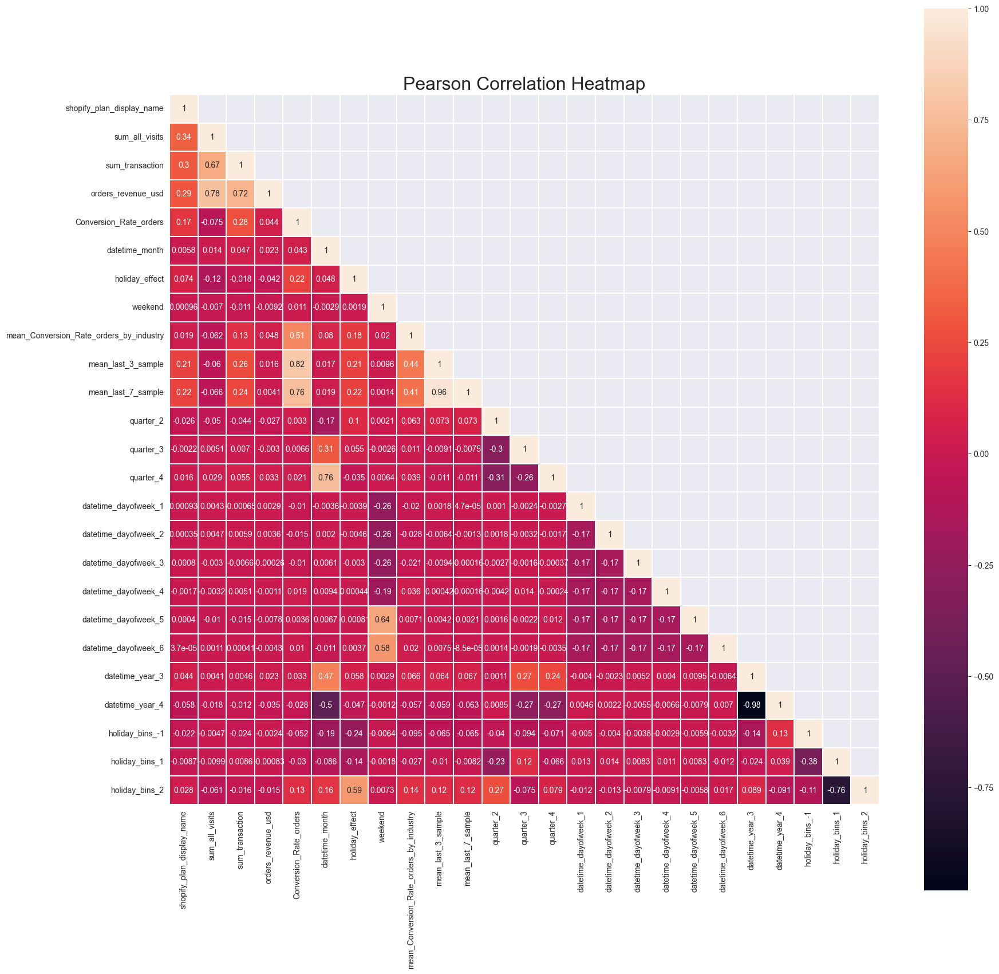

In [81]:
# Let's check the correlation between the numeric features
pearson_corr_heatmap(normal_Conversion_Rate_orders)

In [82]:
normal_Conversion_Rate_orders.columns

Index(['date', 'currency', 'store_id', 'industry', 'country',
       'shopify_plan_display_name', 'sum_all_visits', 'sum_transaction',
       'store_name', 'orders_revenue_usd', 'Conversion_Rate_orders',
       'datetime_month', 'less_than_2_weeks_before_holiday', 'holiday_effect',
       'weekend', 'mean_Conversion_Rate_orders_by_industry',
       'mean_last_3_sample', 'mean_last_7_sample', 'quarter_2', 'quarter_3',
       'quarter_4', 'datetime_dayofweek_1', 'datetime_dayofweek_2',
       'datetime_dayofweek_3', 'datetime_dayofweek_4', 'datetime_dayofweek_5',
       'datetime_dayofweek_6', 'datetime_year_3', 'datetime_year_4',
       'holiday_bins_-1', 'holiday_bins_1', 'holiday_bins_2'],
      dtype='object')

In [ ]:
# We choose these columns for our models or for save some of them to the report
Conversion_Rate_orders_columns = ['store_id','date','Conversion_Rate_orders','weekend','quarter_2','quarter_3','quarter_4','industry','store_name','orders_revenue_usd','less_than_2_weeks_before_holiday','mean_Conversion_Rate_orders_by_industry','holiday_bins_-1', 'holiday_bins_2', 'holiday_bins_1']
Conversion_Rate_orders_X = normal_Conversion_Rate_orders[Conversion_Rate_orders_columns]
Conversion_Rate_orders_X

In [ ]:
from sklearn.model_selection import train_test_split
Conversion_Rate_orders_train, Conversion_Rate_orders_val =  split_data_by_store(Conversion_Rate_orders_X)

In [ ]:
print('x_train shape:', Conversion_Rate_orders_train.shape)
print('y_train shape:', Conversion_Rate_orders_val.shape)

## Models

In [ ]:
# We create 3 dicts one for each model, so the keys in the dict is the store id and the value is the model.
pca_Conversion_Rate_orders_with_anomaly_concat_train = pd.DataFrame()
Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_train = pd.DataFrame()
lof_Conversion_Rate_orders_with_anomaly_concat_train = pd.DataFrame()

pca_Conversion_Rate_orders_with_anomaly_concat_val = pd.DataFrame()
Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_val = pd.DataFrame()
lof_Conversion_Rate_orders_with_anomaly_concat_val = pd.DataFrame()

Conversion_Rate_orders_pca_dict = {}
Conversion_Rate_orders_Isolation_Forsest_dict = {}
Conversion_Rate_orders_lof_dict = {}

In [ ]:
for store in Conversion_Rate_orders_stores:
    data_train = Conversion_Rate_orders_train[(Conversion_Rate_orders_train['store_name'] == store)]
    data_val = Conversion_Rate_orders_val[(Conversion_Rate_orders_val['store_name'] == store)]
    pca_Conversion_Rate_orders_with_anomaly_train,pca_Conversion_Rate_orders_with_anomaly_val = model_anomaly_detection('pca',data_train,data_val,'Conversion_Rate_orders',0.025,8)
    pca_Conversion_Rate_orders_with_anomaly_concat_train = pd.concat([pca_Conversion_Rate_orders_with_anomaly_concat_train,pca_Conversion_Rate_orders_with_anomaly_train],axis = 0)
    pca_Conversion_Rate_orders_with_anomaly_concat_val = pd.concat([pca_Conversion_Rate_orders_with_anomaly_concat_val,pca_Conversion_Rate_orders_with_anomaly_val],axis = 0)


    Isolation_Forsest_Conversion_Rate_orders_with_anomaly_train,Isolation_Forsest_Conversion_Rate_orders_with_anomaly_val = model_anomaly_detection('isolation_forest',data_train,data_val,'Conversion_Rate_orders',0.025,100)
    Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_train = pd.concat([Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_train,Isolation_Forsest_Conversion_Rate_orders_with_anomaly_train],axis = 0)
    Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_val = pd.concat([Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_val,Isolation_Forsest_Conversion_Rate_orders_with_anomaly_val],axis = 0)
    

    lof_Conversion_Rate_orders_with_anomaly_train,lof_Conversion_Rate_orders_with_anomaly_val = model_anomaly_detection('lof',data_train,data_val,'Conversion_Rate_orders',0.025,70)
    lof_Conversion_Rate_orders_with_anomaly_concat_train = pd.concat([lof_Conversion_Rate_orders_with_anomaly_concat_train,lof_Conversion_Rate_orders_with_anomaly_train],axis = 0)
    lof_Conversion_Rate_orders_with_anomaly_concat_val = pd.concat([lof_Conversion_Rate_orders_with_anomaly_concat_val,lof_Conversion_Rate_orders_with_anomaly_val],axis = 0)


PCA Prediction

In [ ]:
# Plot the PCA prediction for top stores for Conversion_Rate_orders 
plot_anomalies(pca_Conversion_Rate_orders_with_anomaly_concat_val,'Conversion_Rate_orders',top_stores_Conversion_Rate_orders)

In [ ]:
# Plot the PCA prediction for low stores for Conversion_Rate_orders 
plot_anomalies(pca_Conversion_Rate_orders_with_anomaly_concat_val,'Conversion_Rate_orders',low_stores_Conversion_Rate_orders)

Isolation_Forsest Prediction

In [ ]:
# Plot the Isolation_Forsest prediction for top stores for Conversion_Rate_orders 
plot_anomalies(Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_val,'Conversion_Rate_orders',top_stores_Conversion_Rate_orders)

In [ ]:
# Plot the Isolation_Forsest prediction for low stores for Conversion_Rate_orders 
plot_anomalies(Isolation_Forsest_Conversion_Rate_orders_with_anomaly_concat_val,'Conversion_Rate_orders',low_stores_Conversion_Rate_orders)

LOF Prediction

In [ ]:
# Plot the LOF prediction for top stores for Conversion_Rate_orders 
plot_anomalies(lof_Conversion_Rate_orders_with_anomaly_concat_val,'Conversion_Rate_orders',top_stores_Conversion_Rate_orders)

In [ ]:
# Plot the LOF prediction for low stores for Conversion_Rate_orders 
plot_anomalies(lof_Conversion_Rate_orders_with_anomaly_concat_val,'Conversion_Rate_orders',low_stores_Conversion_Rate_orders)

## pre-processing test data and prediction

In [ ]:
# Let's do the same pre processing that we did in train set for the test set.
Conversion_Rate_orders_test = pre_processing_test(Conversion_Rate_orders_train,Conversion_Rate_orders_test, Conversion_Rate_orders_stores, Conversion_Rate_orders_columns, dict_holiday_effect_Conversion_Rate,'Conversion_Rate_orders')

In [ ]:
Conversion_Rate_orders_X

In [ ]:
final_Conversion_Rate_orders_X = pd.DataFrame()
# After we choose the best model, let's fit it on all the train set.
for store in Conversion_Rate_orders_stores:
    data = Conversion_Rate_orders_X[(Conversion_Rate_orders_X['store_name'] == store)]
    model, dim, df_train = model_anomaly_detection_for_train_and_validation('isolation_forest',data,'Conversion_Rate_orders',0.025,100)
    final_Conversion_Rate_orders_X = pd.concat([final_Conversion_Rate_orders_X,df_train],axis = 0)
    Conversion_Rate_orders_Isolation_Forsest_dict[store] = (model,dim)

In [ ]:
# Save the datasets for creating the report
final_Conversion_Rate_orders_X.to_csv("Conversion_Rate_orders_X.csv")
Conversion_Rate_orders_test.to_csv("Conversion_Rate_orders_test.csv")

In [ ]:
# Write the dictionary to a file and save the dict of the models
with open('my_dict_Conversion_Rate_orders.pkl', 'wb') as f:
    pickle.dump(Conversion_Rate_orders_Isolation_Forsest_dict, f)

# Sessions

In [114]:
Sessions

,Unnamed: 0,date,currency,orders_revenue,store_id,industry,country,shopify_plan_display_name,sum_all_visits,store_name
0,0,2020-06-30,USD,19.85,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,"Raymond, Stone and Hill"
1,1,2020-07-01,USD,53.16,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,"Raymond, Stone and Hill"
2,2,2020-07-02,USD,79.90,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,"Raymond, Stone and Hill"
3,3,2020-07-03,USD,62.99,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,"Raymond, Stone and Hill"
4,4,2020-07-06,USD,36.96,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,NaN,"Raymond, Stone and Hill"
...,...,...,...,...,...,...,...,...,...,...
89565,409,2023-02-18,NZD,1224.12,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,128.0,Wright-Ellis
89566,410,2023-02-19,NZD,1634.52,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,153.0,Wright-Ellis
89567,411,2023-02-20,NZD,639.73,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,140.0,Wright-Ellis
89568,412,2023-02-21,NZD,1019.50,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,125.0,Wright-Ellis


In [115]:
Sessions= Sessions.rename(columns={'sum_all_visits': 'Sessions'})

In [116]:
Sessions['date'] = pd.to_datetime(Sessions['date'])

In [117]:
# We drop the stores from Tanzania and drop the null values, and finaly we choose the 50 largest stores in Sessions dataset.
Sessions = Sessions[Sessions['country'] != 'Tanzania, United Republic Of']
Sessions = Sessions.dropna()
Sessions_stores = select_stores(Sessions)

In [118]:
# We choose only the samples that happend in the last 3 years.
Sessions = filter_df(Sessions,Sessions_stores)
Sessions

,Unnamed: 0,date,currency,orders_revenue,store_id,industry,country,shopify_plan_display_name,Sessions,store_name
1600,0,2022-01-07,USD,4485.66,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1627.0,"Compton, Lang and Rose"
1601,1,2022-01-08,USD,2506.27,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1304.0,"Compton, Lang and Rose"
1602,2,2022-01-09,USD,3462.25,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1339.0,"Compton, Lang and Rose"
1603,3,2022-01-10,USD,2313.34,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1309.0,"Compton, Lang and Rose"
1604,4,2022-01-11,USD,2804.72,041cdfd2-10c7-4cf2-8527-50eb1ff1fd5a,COSMETICS,United States,Shopify Plus,1600.0,"Compton, Lang and Rose"
...,...,...,...,...,...,...,...,...,...,...
89565,409,2023-02-18,NZD,1224.12,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,128.0,Wright-Ellis
89566,410,2023-02-19,NZD,1634.52,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,153.0,Wright-Ellis
89567,411,2023-02-20,NZD,639.73,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,140.0,Wright-Ellis
89568,412,2023-02-21,NZD,1019.50,fe89ef8e-af58-4aed-89a6-ac505a0564de,APPAREL_AND_FASHION,New Zealand,Shopify,125.0,Wright-Ellis


In [119]:
# We convert the revenue of all the stores to dollar currency.
Sessions = handle_currency(Sessions,'orders_revenue')

In [120]:
# Get the 25 highest profitable stores
top_stores_Sessions = Sessions.groupby('store_id')['orders_revenue_usd'].sum().nlargest(25).index
# Get the 25 lowest profitable stores
low_stores_Sessions = Sessions.groupby('store_id')['orders_revenue_usd'].sum().nsmallest(25).index

In [121]:
# Let's split the date column to year,quater,month and day of week.
Sessions = time_process(Sessions)

In [122]:
# Apply the handling_shopify_plan_and_year that rank these columns
Sessions = handling_shopify_plan_and_year(Sessions)

In [123]:
# For each date we determine if it is before holiday or not. 
Sessions['less_than_2_weeks_before_holiday'] = Sessions[['date', 'country']].apply(lambda row: is_within_two_weeks_of_holiday(row['date'], row['country']), axis=1)

In [124]:
# For each holiday we check the effect on the Sessions.
Sessions['holiday_effect'],dict_holiday_effect_Sessions = holiday_effect(Sessions,'Sessions')

In [125]:
# We want to group by the holidays's impact on the KPI, so we created bins with positive and negative effects with two levels each.
bins = [-2, -0.7,0, 1, 20]
labels = [-2,-1,1,2]  # Assign labels -2,-1,1,2 to the respective bins

# Use pd.cut to bin the 'holiday_effect' column and replace the values with the corresponding labels
Sessions['holiday_bins'] = pd.cut(Sessions['holiday_effect'], bins=bins, labels=labels)
Sessions['holiday_bins'].value_counts()

-1    18805
-2     4078
1       217
2       166
Name: holiday_bins, dtype: int64

In [126]:
# Apply the is_weekend function to the date and country columns
Sessions['weekend'] = Sessions[['datetime_dayofweek', 'country']].apply(lambda row: is_weekend(row['datetime_dayofweek'], row['country']), axis=1)

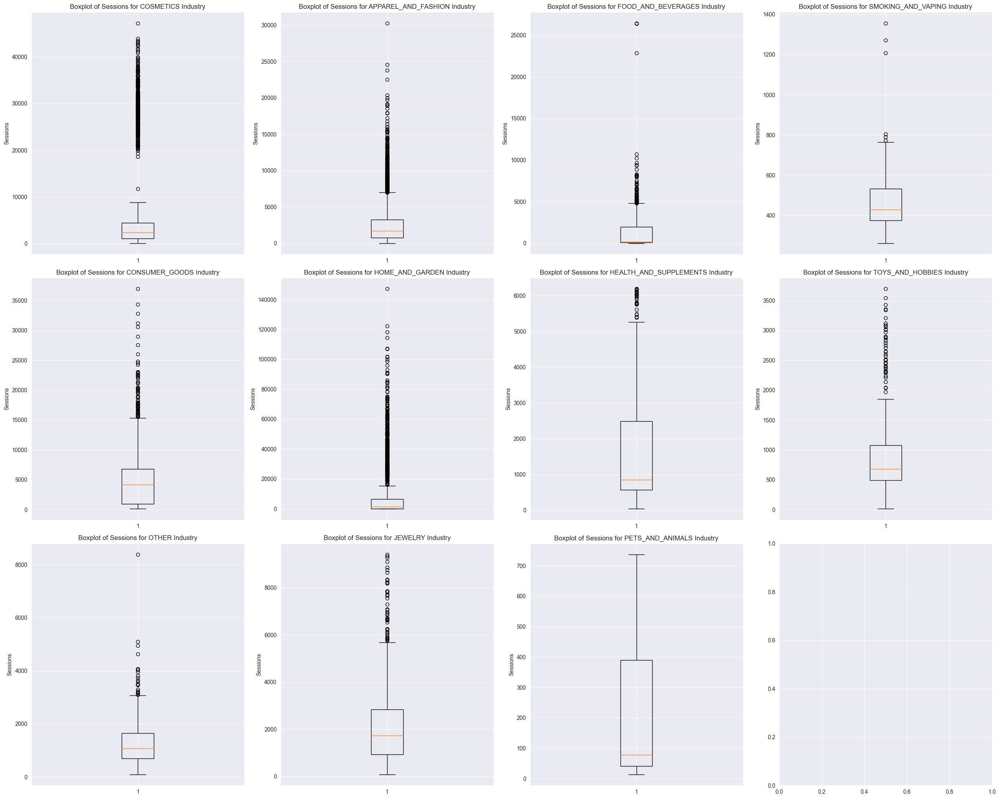

In [127]:
# Boxplot for Sessions for each industry.
boxplot(Sessions,'Sessions')

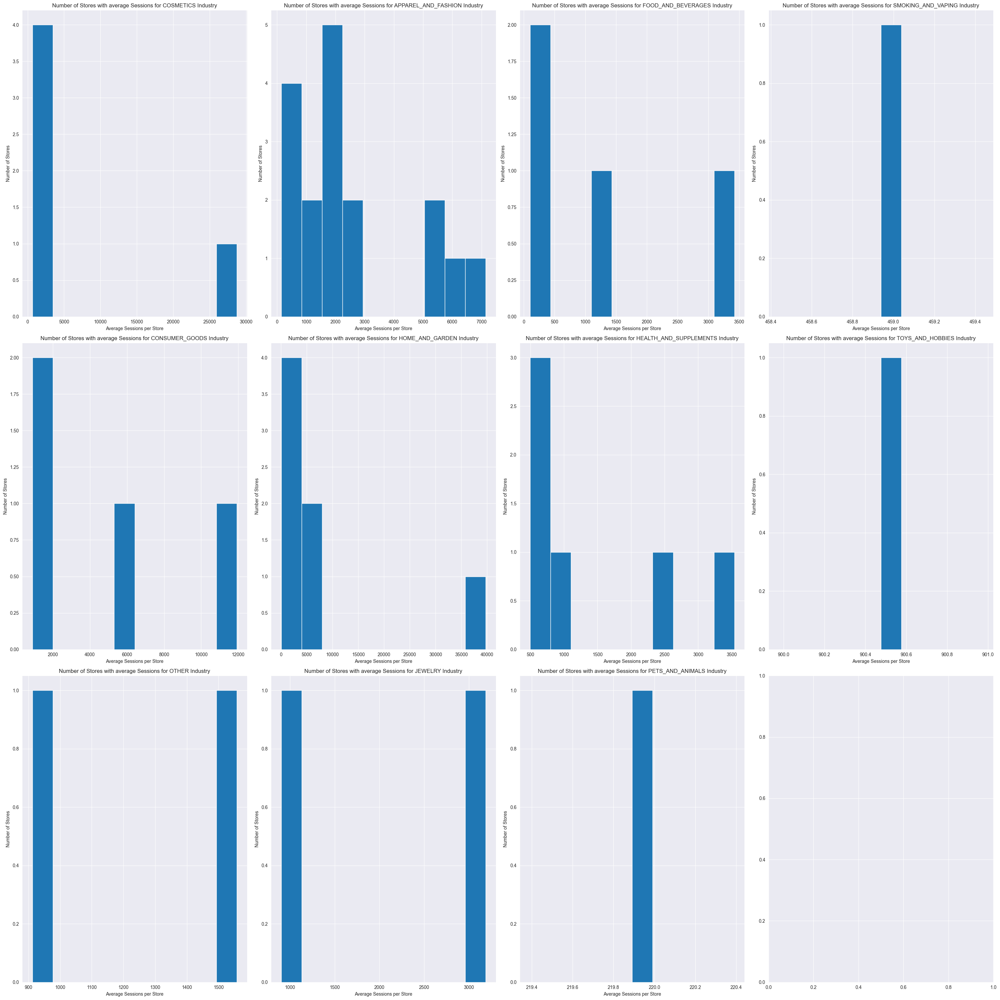

In [159]:
# We want to check how many stores there are in each industry and how the Sessions divides by ten bins.
hist_stores(Sessions,'Sessions')

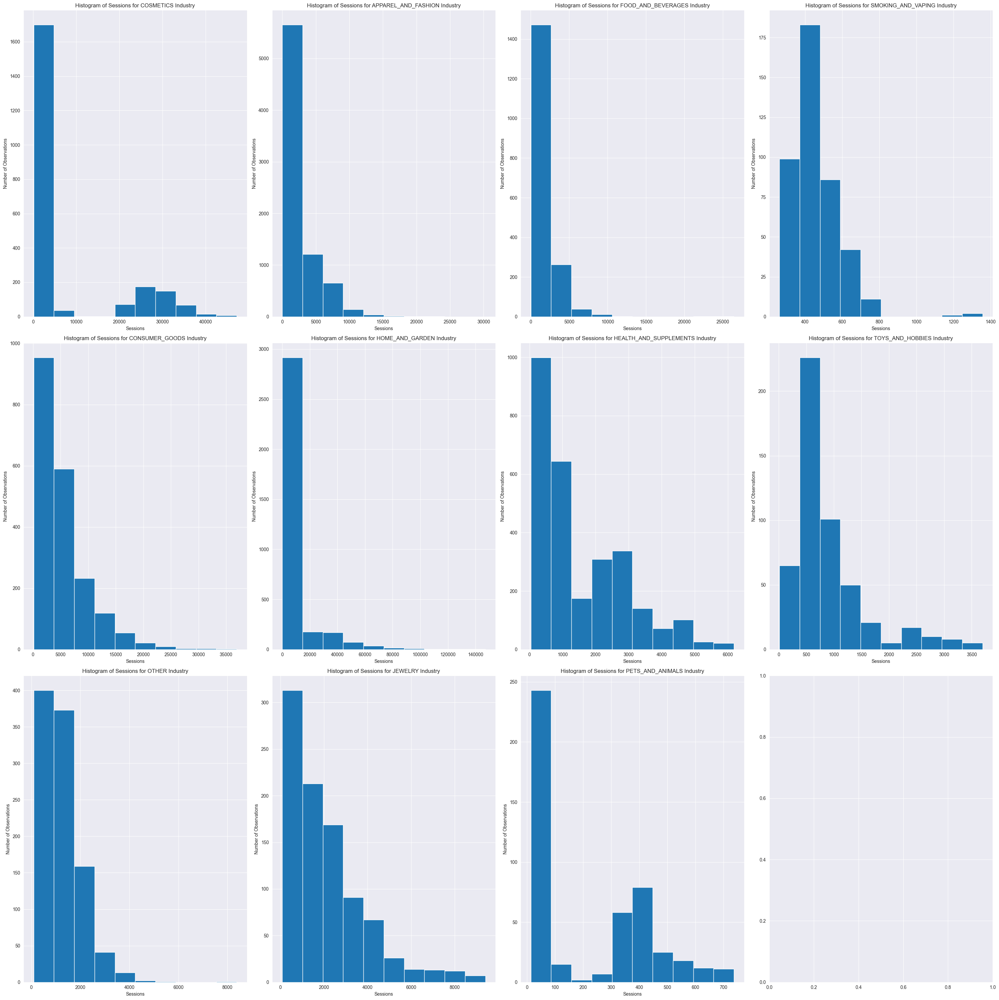

In [155]:
# We want to check how the Sessions divides for each indusrty.
hist_industries(Sessions,'Sessions')

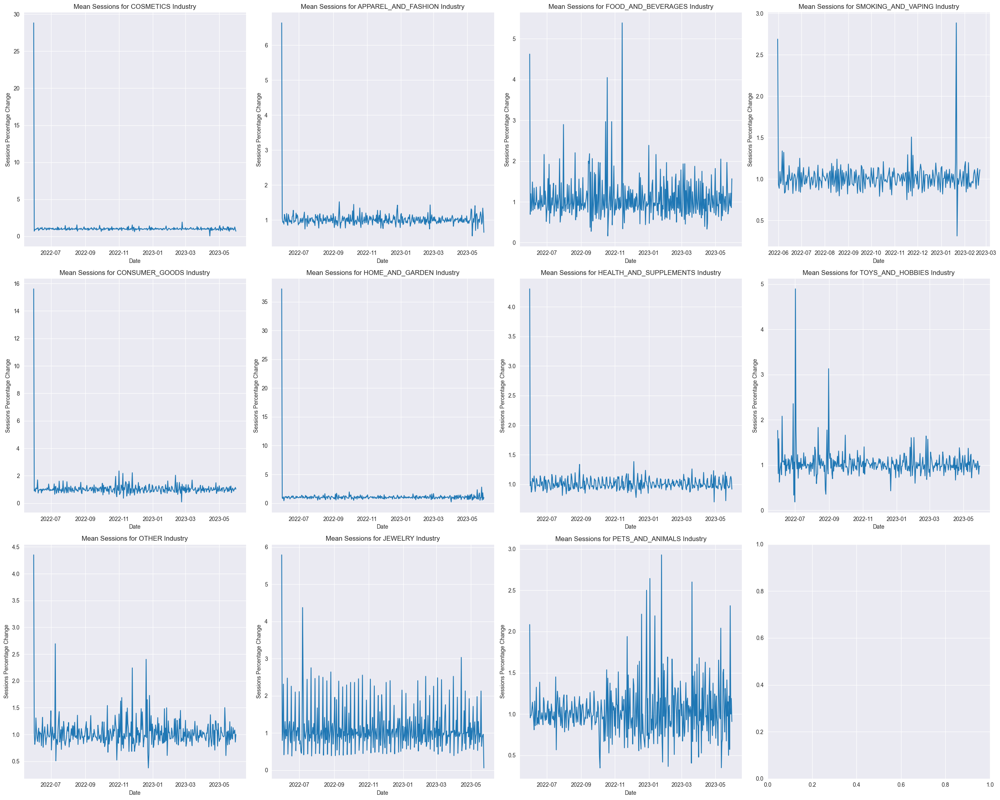

In [130]:
# We want to see the mean change of the Sessions with the day before for each date and industry
mean_kpi_change(Sessions,'Sessions')

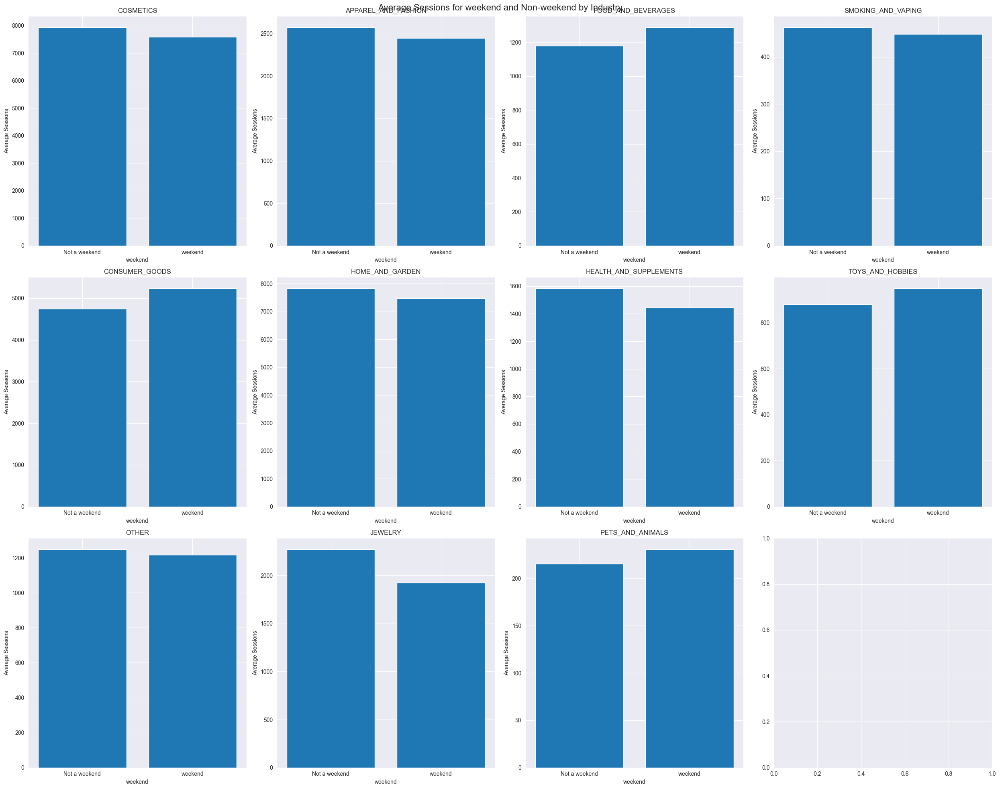

In [131]:
# We want to check the differences in the Sessions between days that in weekend and days aren't for each industry.
kpi_weekend_vs_not(Sessions,'Sessions')

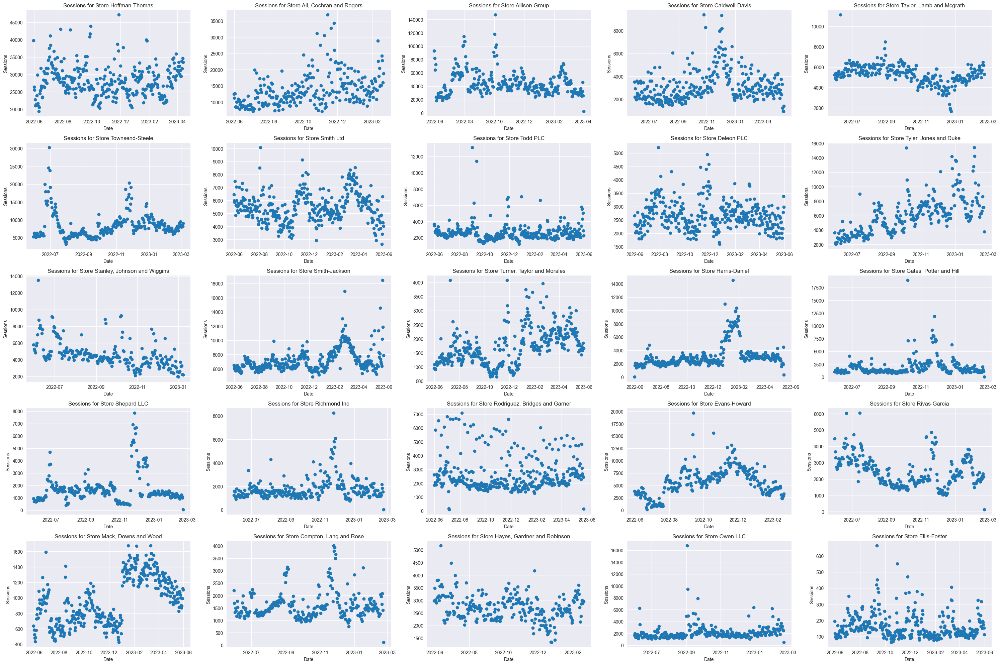

In [132]:
# We want to plot the Sessions for each top store in the last year since 31.05.2023
plot_kpi(Sessions, 'Sessions', top_stores_Sessions)

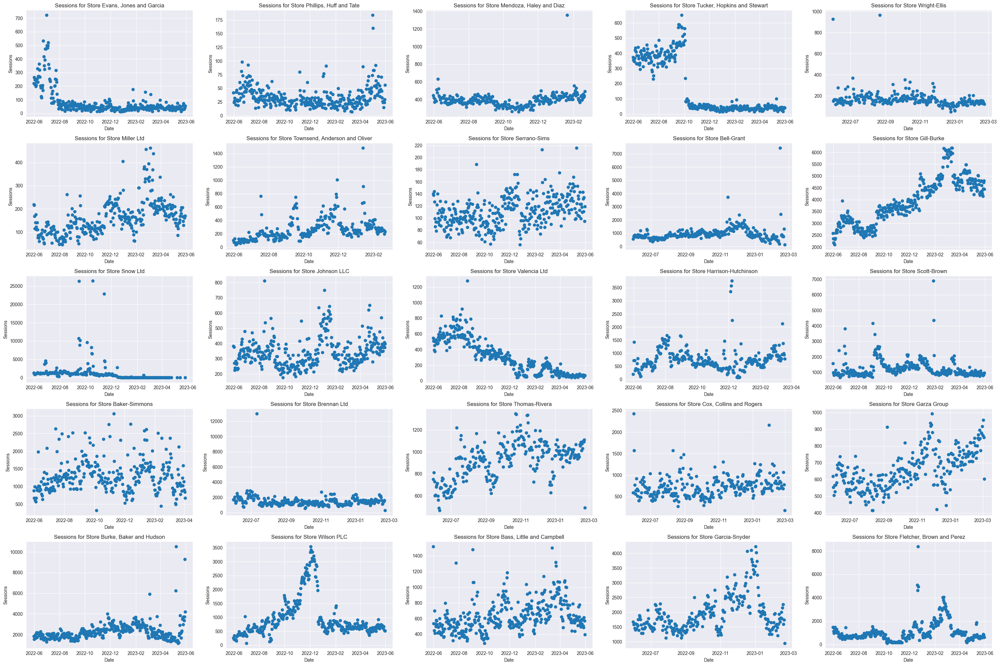

In [133]:
# We want to plot the Sessions for low top store in the last year since 31.05.2023
plot_kpi(Sessions, 'Sessions', low_stores_Sessions)

In [ ]:
# Let's do a feature extraction
Sessions = create_new_features(Sessions,'Sessions')
Sessions = create_rolling_avg_columns(Sessions, 'Sessions')

In [ ]:
# Let's describe the data
Sessions.describe()

In [ ]:
# The following function creates a dummy column for each option of the dates categorical variables
normal_Sessions=process_dummies_features(Sessions)
# Let's drop the null values in the data set
normal_Sessions = normal_Sessions.dropna()
normal_Sessions.shape

In [ ]:
# Let's check the correlation between the numeric features
pearson_corr_heatmap(normal_Sessions)

In [ ]:
normal_Sessions.columns

In [ ]:
# We choose these columns for our models or for save some of them to the report
Sessions_columns = ['store_id','date','Sessions','weekend','quarter_2','quarter_3','quarter_4','industry','store_name','holiday_bins_-1', 'holiday_bins_2', 'holiday_bins_1','orders_revenue_usd','less_than_2_weeks_before_holiday','mean_Sessions_by_industry']
Sessions_X = normal_Sessions[Sessions_columns]
Sessions_X

In [ ]:
from sklearn.model_selection import train_test_split
Sessions_train, Sessions_val =  split_data_by_store(Sessions_X)

In [ ]:
print('x_train shape:', Sessions_train.shape)
print('y_train shape:', Sessions_val.shape)

## Models

In [ ]:
# We create 3 dicts one for each model, so the keys in the dict is the store id and the value is the model.
pca_Sessions_with_anomaly_concat_train = pd.DataFrame()
isolation_forest_Sessions_with_anomaly_concat_train = pd.DataFrame()
lof_Sessions_with_anomaly_concat_train = pd.DataFrame()

pca_Sessions_with_anomaly_concat_val = pd.DataFrame()
isolation_forest_Sessions_with_anomaly_concat_val = pd.DataFrame()
lof_Sessions_with_anomaly_concat_val = pd.DataFrame()

Sessions_pca_dict = {}
Sessions_Isolation_Forsest_dict = {}
Sessions_lof_dict = {}

In [ ]:
for store in Sessions_stores:
    data_train = Sessions_train[(Sessions_train['store_name'] == store)]
    data_val = Sessions_val[(Sessions_val['store_name'] == store)]
    pca_Sessions_with_anomaly_train,pca_Sessions_with_anomaly_val = model_anomaly_detection('pca',data_train,data_val,'Sessions',0.02,2)
    pca_Sessions_with_anomaly_concat_train = pd.concat([pca_Sessions_with_anomaly_concat_train,pca_Sessions_with_anomaly_train],axis = 0)
    pca_Sessions_with_anomaly_concat_val = pd.concat([pca_Sessions_with_anomaly_concat_val,pca_Sessions_with_anomaly_val],axis = 0)

    isolation_forest_Sessions_with_anomaly_train,isolation_forest_Sessions_with_anomaly_val = model_anomaly_detection('isolation_forest',data_train,data_val,'Sessions',0.02,20)
    isolation_forest_Sessions_with_anomaly_concat_train = pd.concat([isolation_forest_Sessions_with_anomaly_concat_train,isolation_forest_Sessions_with_anomaly_train],axis = 0)
    isolation_forest_Sessions_with_anomaly_concat_val = pd.concat([isolation_forest_Sessions_with_anomaly_concat_val,isolation_forest_Sessions_with_anomaly_val],axis = 0)
    

    lof_Sessions_with_anomaly_train,lof_Sessions_with_anomaly_val = model_anomaly_detection('lof',data_train,data_val,'Sessions',0.02,30)
    lof_Sessions_with_anomaly_concat_train = pd.concat([lof_Sessions_with_anomaly_concat_train,lof_Sessions_with_anomaly_train],axis = 0)
    lof_Sessions_with_anomaly_concat_val = pd.concat([lof_Sessions_with_anomaly_concat_val,lof_Sessions_with_anomaly_val],axis = 0)


PCA Prediction

In [ ]:
# Plot the PCA prediction for top stores for Sessions 
plot_anomalies(pca_Sessions_with_anomaly_concat_val,'Sessions',top_stores_Sessions)

In [ ]:
# Plot the PCA prediction for low stores for Sessions 
plot_anomalies(pca_Sessions_with_anomaly_concat_val,'Sessions',low_stores_Sessions)

Isolation_Forsest Prediction

In [ ]:
# Plot the Isolation_Forsest prediction for top stores for Sessions 
plot_anomalies(isolation_forest_Sessions_with_anomaly_concat_val,'Sessions',top_stores_Sessions)

In [ ]:
# Plot the Isolation_Forsest prediction for low stores for Sessions 
plot_anomalies(isolation_forest_Sessions_with_anomaly_concat_val,'Sessions',low_stores_Sessions)

LOF Prediction

In [ ]:
# Plot the LOF prediction for top stores for Sessions 
plot_anomalies(lof_Sessions_with_anomaly_concat_val,'Sessions',top_stores_Sessions)

In [ ]:
# Plot the LOF prediction for low stores for Sessions 
plot_anomalies(lof_Sessions_with_anomaly_concat_val,'Sessions',low_stores_Sessions)

## pre-processing test data and prediction

In [ ]:
# Let's do the same pre processing that we did in train set for the test set.
Sessions_test = pre_processing_test(Sessions_train,Sessions_test, Sessions_stores, Sessions_columns, dict_holiday_effect_Sessions,'Sessions')

In [ ]:
Sessions_X

In [ ]:
final_Sessions_X = pd.DataFrame()
# After we choose the best model, let's fit it on all the train set.
for store in Sessions_stores:
    data = Sessions_X[(Sessions_X['store_name'] == store)]
    model, dim, df_train = model_anomaly_detection_for_train_and_validation('lof',data,'Sessions',0.02,30)
    final_Sessions_X = pd.concat([final_Sessions_X,df_train],axis = 0)
    Sessions_lof_dict[store] = (model,dim)

In [ ]:
# Save the datasets for creating the report
final_Sessions_X.to_csv("Sessions_X.csv")
Sessions_test.to_csv("Sessions_test.csv")

In [ ]:
final_Sessions_X

In [ ]:
# Write the dictionary to a file and save the dict of the models
with open('my_dict_Sessions.pkl', 'wb') as f:
    pickle.dump(Sessions_lof_dict, f)

# AOV_orders

In [160]:
AOV_orders

,Unnamed: 0,date,aov,order_count,total_discounts,total_tax,currency,store_id,industry,country,shopify_plan_display_name,store_name
0,0,2021-10-21,32.630000,5,23.58,3.84,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,"Raymond, Stone and Hill"
1,1,2022-05-11,90.770000,1,8.74,6.53,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,"Raymond, Stone and Hill"
2,2,2022-04-13,58.210000,1,13.59,3.81,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,"Raymond, Stone and Hill"
3,3,2022-04-27,25.720000,1,0.00,1.74,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,"Raymond, Stone and Hill"
4,4,2022-08-26,47.755000,4,0.00,9.49,USD,00ce55fe-2b4c-493a-b843-cda21e9340ab,FOOD_AND_BEVERAGES,United States,Shopify,"Raymond, Stone and Hill"
...,...,...,...,...,...,...,...,...,...,...,...,...
61562,735,2021-12-21,24.990000,1,0.00,0.00,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC
61563,736,2022-07-03,32.645556,9,48.16,0.00,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC
61564,737,2021-04-06,29.950000,1,0.00,0.00,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC
61565,738,2022-01-28,35.720000,5,37.68,0.00,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC


In [161]:
AOV_orders= AOV_orders.rename(columns={'aov': 'AOV'})

In [162]:
AOV_orders['orders_revenue'] = AOV_orders['AOV'] * AOV_orders['order_count']

In [163]:
AOV_orders['date'] = pd.to_datetime(AOV_orders['date'])

In [164]:
# We drop the stores from Tanzania and drop the null values, and finaly we choose the 50 largest stores in AOV_orders dataset.
AOV_orders = AOV_orders[AOV_orders['country'] != 'Tanzania, United Republic Of']
AOV_orders = AOV_orders.dropna()
AOV_orders_stores = select_stores(AOV_orders)

In [165]:
# We choose only the samples that happend in the last 3 years.
AOV_orders = filter_df(AOV_orders,AOV_orders_stores)
AOV_orders

,Unnamed: 0,date,AOV,order_count,total_discounts,total_tax,currency,store_id,industry,country,shopify_plan_display_name,store_name,orders_revenue
694,91,2020-09-28,175.007000,40,1371.56,0.0,USD,01a53acd-0e45-4881-9207-ee8d2e7a9505,FOOD_AND_BEVERAGES,Italy,Shopify Plus,Duran-Sparks,7000.28
695,92,2020-09-29,135.731053,38,737.01,0.0,USD,01a53acd-0e45-4881-9207-ee8d2e7a9505,FOOD_AND_BEVERAGES,Italy,Shopify Plus,Duran-Sparks,5157.78
696,93,2020-09-30,145.956500,40,810.71,0.0,USD,01a53acd-0e45-4881-9207-ee8d2e7a9505,FOOD_AND_BEVERAGES,Italy,Shopify Plus,Duran-Sparks,5838.26
697,94,2020-10-01,139.677179,39,911.49,0.0,USD,01a53acd-0e45-4881-9207-ee8d2e7a9505,FOOD_AND_BEVERAGES,Italy,Shopify Plus,Duran-Sparks,5447.41
698,95,2020-10-02,121.833571,28,543.46,0.0,USD,01a53acd-0e45-4881-9207-ee8d2e7a9505,FOOD_AND_BEVERAGES,Italy,Shopify Plus,Duran-Sparks,3411.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...
61562,735,2021-12-21,24.990000,1,0.00,0.0,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC,24.99
61563,736,2022-07-03,32.645556,9,48.16,0.0,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC,293.81
61564,737,2021-04-06,29.950000,1,0.00,0.0,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC,29.95
61565,738,2022-01-28,35.720000,5,37.68,0.0,USD,675f38f7-f407-440b-ab72-cf803c8d8e1b,HEALTH_AND_SUPPLEMENTS,United States,Advanced Shopify,Smith PLC,178.60


In [166]:
# We convert the revenue of all the stores to dollar currency.
AOV_orders = handle_currency(AOV_orders,'AOV')
AOV_orders = handle_currency(AOV_orders,'orders_revenue')

In [167]:
# Get the 25 highest profitable stores
top_stores_AOV_orders = AOV_orders.groupby('store_id')['AOV_usd'].sum().nlargest(25).index
# Get the 25 lowest profitable stores
low_stores_AOV_orders = AOV_orders.groupby('store_id')['AOV_usd'].sum().nsmallest(25).index

In [168]:
# Let's split the date column to year,quater,month and day of week.
AOV_orders = time_process(AOV_orders)

In [169]:
# Apply the handling_shopify_plan_and_year that rank these columns
AOV_orders = handling_shopify_plan_and_year(AOV_orders)

In [170]:
# For each date we determine if it is before holiday or not. 
AOV_orders['less_than_2_weeks_before_holiday'] = AOV_orders[['date', 'country']].apply(lambda row: is_within_two_weeks_of_holiday(row['date'], row['country']), axis=1)

In [171]:
# For each holiday we check the effect on the AOV.
AOV_orders['holiday_effect'],dict_holiday_effect_AOV = holiday_effect(AOV_orders,'AOV_usd')

In [172]:
# We want to group by the holidays's impact on the KPI, so we created bins with positive and negative effects with two levels each.
bins = [-1, -0.22,0, 0.2, 1]
labels = [-2,-1,1,2]  # Assign labels -2,-1,1,2 to the respective bins

# Use pd.cut to bin the 'holiday_effect' column and replace the values with the corresponding labels
AOV_orders['holiday_bins'] = pd.cut(AOV_orders['holiday_effect'], bins=bins, labels=labels)
AOV_orders['holiday_bins'].value_counts()

1     26975
2     13123
-1     2204
-2     1772
Name: holiday_bins, dtype: int64

In [173]:
# Apply the is_weekend function to the date and country columns
AOV_orders['weekend'] = AOV_orders[['datetime_dayofweek', 'country']].apply(lambda row: is_weekend(row['datetime_dayofweek'], row['country']), axis=1)

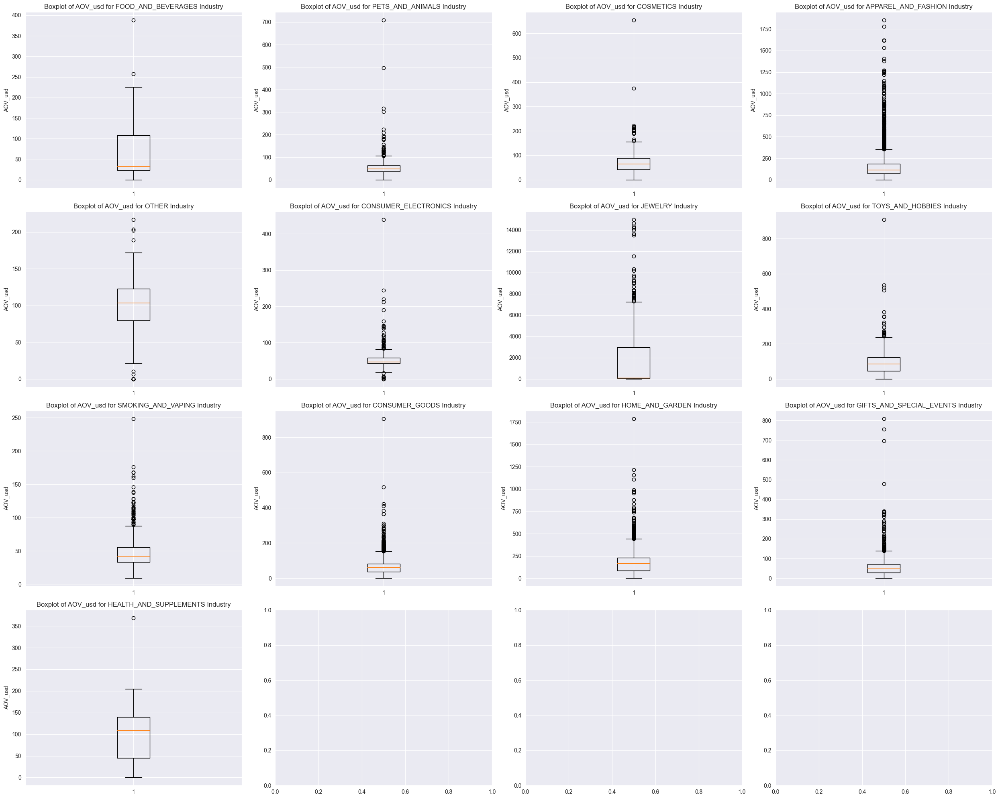

In [174]:
# Boxplot for AOV for each industry.
boxplot(AOV_orders,'AOV_usd')

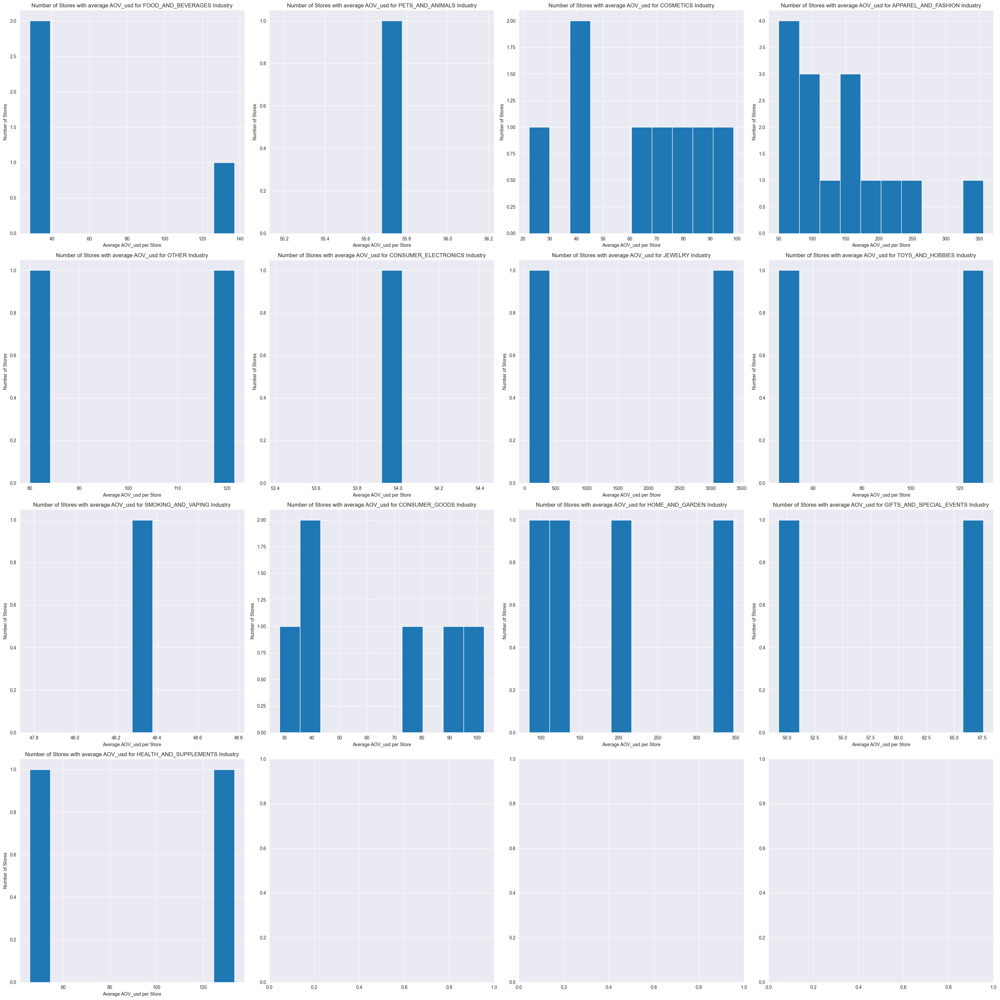

In [175]:
# We want to check how many stores there are in each industry and how the AOV divides by ten bins.
hist_stores(AOV_orders,'AOV_usd')

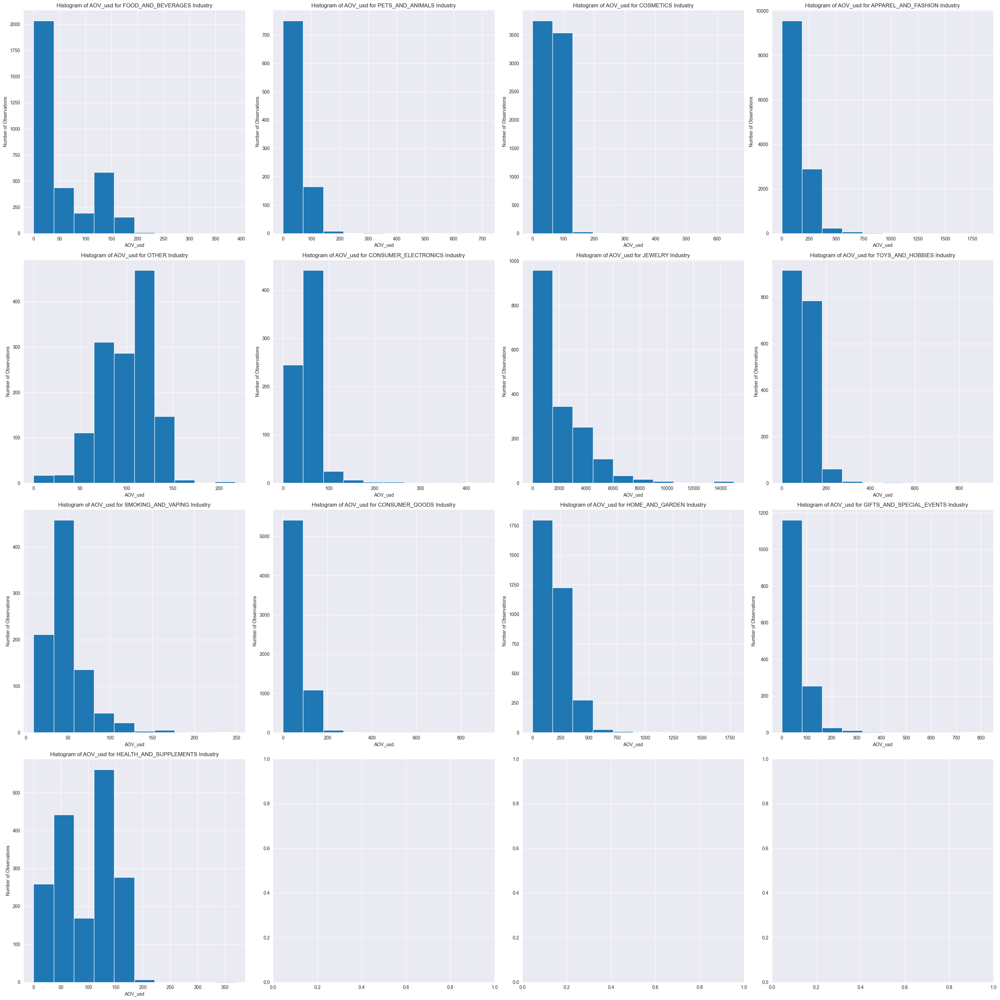

In [176]:
# We want to check how the AOV divides for each indusrty.
hist_industries(AOV_orders,'AOV_usd')

In [ ]:
# We want to see the mean change of the AOV with the day before for each date and industry
mean_kpi_change(AOV_orders,'AOV_usd')

In [ ]:
# We want to check the differences in the AOV between days that in weekend and days aren't for each industry.
kpi_weekend_vs_not(AOV_orders,'AOV_usd')

In [ ]:
# We want to plot the AOV for each top store in the last year since 31.05.2023
plot_kpi(AOV_orders,'AOV_usd',top_stores_AOV_orders)

In [ ]:
# We want to plot the AOV for each low store in the last year since 31.05.2023
plot_kpi(AOV_orders,'AOV_usd',low_stores_AOV_orders)

In [ ]:
# Let's do a feature extraction
AOV_orders = create_new_features(AOV_orders,'AOV_usd')
AOV_orders = create_rolling_avg_columns(AOV_orders, 'AOV_usd')

In [ ]:
# Let's describe the data
AOV_orders.describe()

In [ ]:
# The following function creates a dummy column for each option of the dates categorical variables
normal_AOV_orders=process_dummies_features(AOV_orders)
# Let's drop the null values in the data set
normal_AOV_orders = normal_AOV_orders.dropna()
normal_AOV_orders.shape

In [ ]:
# Let's check the correlation between the numeric features
pearson_corr_heatmap(normal_AOV_orders)

In [ ]:
normal_AOV_orders.columns

In [ ]:
# We choose these columns for our models or for save some of them to the report
AOV_orders_columns = ['store_id','date','AOV_usd','weekend','quarter_2','quarter_3','quarter_4','industry','store_name','holiday_bins_-1', 'holiday_bins_2', 'holiday_bins_1','orders_revenue_usd','less_than_2_weeks_before_holiday','mean_AOV_usd_by_industry']
AOV_orders_X = normal_AOV_orders[AOV_orders_columns]
AOV_orders_X

In [ ]:
from sklearn.model_selection import train_test_split
AOV_train, AOV_val =  split_data_by_store(AOV_orders_X)

In [ ]:
print('x_train shape:', AOV_train.shape)
print('y_train shape:', AOV_val.shape)

## Models

In [ ]:
# We create 3 dicts one for each model, so the keys in the dict is the store id and the value is the model.
pca_AOV_with_anomaly_concat_train = pd.DataFrame()
Isolation_Forsest_AOV_with_anomaly_concat_train = pd.DataFrame()
lof_AOV_with_anomaly_concat_train = pd.DataFrame()

pca_AOV_with_anomaly_concat_val = pd.DataFrame()
Isolation_Forsest_AOV_with_anomaly_concat_val = pd.DataFrame()
lof_AOV_with_anomaly_concat_val = pd.DataFrame()

AOV_pca_dict = {}
AOV_Isolation_Forsest_dict = {}
AOV_lof_dict = {}

In [ ]:
for store in AOV_orders_stores:
    data_train = AOV_train[(AOV_train['store_name'] == store)]
    data_val = AOV_val[(AOV_val['store_name'] == store)]
    pca_AOV_with_anomaly_train,pca_AOV_with_anomaly_val = model_anomaly_detection('pca',data_train,data_val,'AOV_usd',0.01,2)
    pca_AOV_with_anomaly_concat_train = pd.concat([pca_AOV_with_anomaly_concat_train,pca_AOV_with_anomaly_train],axis = 0)
    pca_AOV_with_anomaly_concat_val = pd.concat([pca_AOV_with_anomaly_concat_val,pca_AOV_with_anomaly_val],axis = 0)
    

    Isolation_Forsest_AOV_with_anomaly_train,Isolation_Forsest_AOV_with_anomaly_val = model_anomaly_detection('isolation_forest',data_train,data_val,'AOV_usd',0.01,20)
    Isolation_Forsest_AOV_with_anomaly_concat_train = pd.concat([Isolation_Forsest_AOV_with_anomaly_concat_train,Isolation_Forsest_AOV_with_anomaly_train],axis = 0)
    Isolation_Forsest_AOV_with_anomaly_concat_val = pd.concat([Isolation_Forsest_AOV_with_anomaly_concat_val,Isolation_Forsest_AOV_with_anomaly_val],axis = 0)
    

    lof_AOV_with_anomaly_train,lof_AOV_with_anomaly_val = model_anomaly_detection('lof',data_train,data_val,'AOV_usd',0.015,50)
    lof_AOV_with_anomaly_concat_train = pd.concat([lof_AOV_with_anomaly_concat_train,lof_AOV_with_anomaly_train],axis = 0)
    lof_AOV_with_anomaly_concat_val = pd.concat([lof_AOV_with_anomaly_concat_val,lof_AOV_with_anomaly_val],axis = 0)

PCA Prediction

In [ ]:
# Plot the PCA prediction for top stores for AOV 
plot_anomalies(pca_AOV_with_anomaly_concat_val,'AOV_usd',top_stores_AOV_orders)

In [ ]:
# Plot the PCA prediction for low stores for AOV 
plot_anomalies(pca_AOV_with_anomaly_concat_val,'AOV_usd',low_stores_AOV_orders)

Isolation_Forsest Prediction

In [ ]:
# Plot the Isolation_Forsest prediction for top stores for AOV 
plot_anomalies(Isolation_Forsest_AOV_with_anomaly_concat_val,'AOV_usd',top_stores_AOV_orders)

In [ ]:
# Plot the Isolation_Forsest prediction for low stores for AOV 
plot_anomalies(Isolation_Forsest_AOV_with_anomaly_concat_val,'AOV_usd',low_stores_AOV_orders)

LOF Prediction

In [ ]:
# Plot the LOF prediction for top stores for AOV 
plot_anomalies(lof_AOV_with_anomaly_concat_val,'AOV_usd',top_stores_AOV_orders)

In [ ]:
# Plot the LOF prediction for low stores for AOV 
plot_anomalies(lof_AOV_with_anomaly_concat_val,'AOV_usd',low_stores_AOV_orders)

## pre-processing test data and prediction


In [ ]:
# Let's do the same pre-processing that we did in train set for the test set.
AOV_orders_test = pre_processing_test(AOV_train,AOV_orders_test, AOV_orders_stores, AOV_orders_columns, dict_holiday_effect_AOV,'AOV_usd')

In [ ]:
final_AOV_orders_X = pd.DataFrame()
# After we choose the best model, let's fit it on all the train set.
for store in AOV_orders_stores:
    data = AOV_orders_X[(AOV_orders_X['store_name'] == store)]
    model, dim,df_train = model_anomaly_detection_for_train_and_validation('lof',data,'AOV_usd',0.015,50)
    final_AOV_orders_X = pd.concat([final_AOV_orders_X,df_train],axis = 0)
    AOV_lof_dict[store] = (model,dim)

In [ ]:
# Save the datasets for creating the report
final_AOV_orders_X.to_csv("AOV_usd_X.csv")
AOV_orders_test.to_csv("AOV_usd_test.csv")

In [ ]:
# Write the dictionary to a file and save the dict of the models
with open('my_dict_AOV_usd.pkl', 'wb') as f:
    pickle.dump(AOV_lof_dict, f)